In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

import warnings
warnings.filterwarnings(action='ignore')

pd.options.display.max_rows = 50
pd.options.display.max_columns = 100

train_df = pd.read_csv('train.csv')

train_df['age_group'].replace('+70s', '70s+', inplace=True)
train_df.drop('index', axis=1, inplace=True)

In [29]:
train_df

,QaA,QaE,QbA,QbE,QcA,QcE,QdA,QdE,QeA,QeE,QfA,QfE,QgA,QgE,QhA,QhE,QiA,QiE,QjA,QjE,QkA,QkE,QlA,QlE,QmA,QmE,QnA,QnE,QoA,QoE,QpA,QpE,QqA,QqE,QrA,QrE,QsA,QsE,QtA,QtE,age_group,education,engnat,familysize,gender,hand,married,race,religion,tp01,tp02,tp03,tp04,tp05,tp06,tp07,tp08,tp09,tp10,urban,voted,wf_01,wf_02,wf_03,wr_01,wr_02,wr_03,wr_04,wr_05,wr_06,wr_07,wr_08,wr_09,wr_10,wr_11,wr_12,wr_13
0,3.0,363,4.0,1370,5.0,997,1.0,1024,2.0,1577,5.0,539,2.0,586,4.0,1095,5.0,1142,4.0,1287,4.0,883,4.0,851,2.0,851,5.0,816,2.0,579,2.0,924,2.0,366,2.0,876,2.0,633,1.0,1115,30s,2,1,4,Female,1,3,White,Other,2,2,2,1,2,1,7,4,4,3,1,2,0,0,0,0,1,0,0,1,0,1,1,0,1,0,1,1
1,5.0,647,5.0,1313,3.0,3387,5.0,2969,1.0,4320,3.0,2190,1.0,826,1.0,4082,5.0,1867,3.0,1264,5.0,2943,4.0,3927,1.0,4329,5.0,1828,1.0,1214,5.0,2414,5.0,1356,1.0,3039,4.0,4304,1.0,1346,20s,4,2,3,Female,1,1,Asian,Hindu,1,1,0,0,1,2,3,4,0,4,3,2,0,0,0,0,1,0,1,1,0,1,1,0,1,0,1,1
2,4.0,1623,1.0,1480,1.0,1021,4.0,3374,5.0,1333,1.0,531,4.0,1167,1.0,1016,3.0,2653,2.0,1569,5.0,998,5.0,2547,2.0,918,4.0,2153,2.0,1304,1.0,1131,5.0,937,4.0,1327,1.0,1170,1.0,1409,30s,3,1,3,Male,1,2,White,Other,2,3,1,5,3,4,2,6,1,3,2,1,0,0,1,1,1,0,1,1,0,1,1,1,1,0,1,1
3,3.0,504,3.0,2311,4.0,992,3.0,3245,1.0,357,2.0,1519,4.0,159,3.0,2275,5.0,2809,4.0,5614,3.0,3219,4.0,1296,4.0,9046,4.0,1216,4.0,1169,4.0,23868,3.0,581,4.0,8830,4.0,2392,5.0,1312,20s,4,2,0,Female,1,1,Asian,Hindu,2,4,1,1,1,3,1,3,1,3,3,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,1,1
4,1.0,927,1.0,707,5.0,556,2.0,1062,1.0,1014,2.0,628,1.0,991,1.0,1259,5.0,1153,5.0,1388,5.0,740,5.0,1181,4.0,547,2.0,575,1.0,754,4.0,1140,5.0,323,5.0,1070,1.0,583,2.0,1889,20s,3,1,2,Male,1,2,White,Agnostic,1,1,1,6,0,2,0,6,2,6,1,1,0,1,0,1,1,0,1,1,1,1,1,0,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45527,2.0,1050,5.0,619,4.0,328,1.0,285,1.0,602,1.0,267,1.0,315,1.0,483,1.0,1016,4.0,278,4.0,611,5.0,215,4.0,388,1.0,299,2.0,1915,4.0,439,2.0,823,1.0,309,5.0,586,4.0,2252,10s,2,1,1,Female,3,1,White,Jewish,1,2,6,1,2,6,3,0,6,4,3,2,0,0,1,1,1,0,1,1,0,1,1,1,1,0,1,1
45528,2.0,581,3.0,1353,4.0,1164,1.0,798,3.0,1680,2.0,560,2.0,640,1.0,1415,2.0,4494,5.0,1392,2.0,2478,5.0,1268,3.0,843,2.0,1401,4.0,1524,4.0,719,2.0,754,3.0,1118,4.0,654,4.0,1197,30s,2,1,2,Male,1,1,White,Atheist,2,2,2,3,1,3,3,4,1,5,1,2,0,0,1,1,1,1,1,1,0,1,1,1,1,0,1,1
45529,4.0,593,1.0,857,1.0,1047,4.0,1515,5.0,1690,4.0,1253,5.0,1094,1.0,1283,5.0,2209,1.0,1764,5.0,1062,5.0,1489,1.0,1908,4.0,891,1.0,1298,1.0,1200,5.0,473,5.0,1779,3.0,1355,1.0,667,10s,2,1,1,Female,1,1,White,Christian_Other,4,4,2,4,0,1,0,2,1,6,2,1,0,0,0,1,1,0,1,1,0,1,1,0,1,0,1,1
45530,1.0,747,3.0,1331,4.0,892,2.0,1281,1.0,1328,1.0,599,1.0,650,1.0,1429,5.0,1748,1.0,770,5.0,1025,5.0,742,4.0,4180,3.0,707,1.0,489,1.0,913,4.0,1301,4.0,1680,4.0,737,1.0,1124,40s,4,1,2,Male,3,1,White,Atheist,1,2,0,4,0,1,3,2,2,4,0,1,0,0,0,1,1,0,1,1,0,1,1,1,1,0,1,1


In [30]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45532 entries, 0 to 45531
Data columns (total 77 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   QaA         45532 non-null  float64
 1   QaE         45532 non-null  int64  
 2   QbA         45532 non-null  float64
 3   QbE         45532 non-null  int64  
 4   QcA         45532 non-null  float64
 5   QcE         45532 non-null  int64  
 6   QdA         45532 non-null  float64
 7   QdE         45532 non-null  int64  
 8   QeA         45532 non-null  float64
 9   QeE         45532 non-null  int64  
 10  QfA         45532 non-null  float64
 11  QfE         45532 non-null  int64  
 12  QgA         45532 non-null  float64
 13  QgE         45532 non-null  int64  
 14  QhA         45532 non-null  float64
 15  QhE         45532 non-null  int64  
 16  QiA         45532 non-null  float64
 17  QiE         45532 non-null  int64  
 18  QjA         45532 non-null  float64
 19  QjE         45532 non-nul

In [31]:
j = -1
for i in train_df.isnull().sum():
    j += 1
    print('Number of Nan ("{0}" column): {1}'.format(train_df.isnull().sum().index[j], i))
    

Number of Nan ("QaA" column): 0
Number of Nan ("QaE" column): 0
Number of Nan ("QbA" column): 0
Number of Nan ("QbE" column): 0
Number of Nan ("QcA" column): 0
Number of Nan ("QcE" column): 0
Number of Nan ("QdA" column): 0
Number of Nan ("QdE" column): 0
Number of Nan ("QeA" column): 0
Number of Nan ("QeE" column): 0
Number of Nan ("QfA" column): 0
Number of Nan ("QfE" column): 0
Number of Nan ("QgA" column): 0
Number of Nan ("QgE" column): 0
Number of Nan ("QhA" column): 0
Number of Nan ("QhE" column): 0
Number of Nan ("QiA" column): 0
Number of Nan ("QiE" column): 0
Number of Nan ("QjA" column): 0
Number of Nan ("QjE" column): 0
Number of Nan ("QkA" column): 0
Number of Nan ("QkE" column): 0
Number of Nan ("QlA" column): 0
Number of Nan ("QlE" column): 0
Number of Nan ("QmA" column): 0
Number of Nan ("QmE" column): 0
Number of Nan ("QnA" column): 0
Number of Nan ("QnE" column): 0
Number of Nan ("QoA" column): 0
Number of Nan ("QoE" column): 0
Number of Nan ("QpA" column): 0
Number o

<AxesSubplot:>

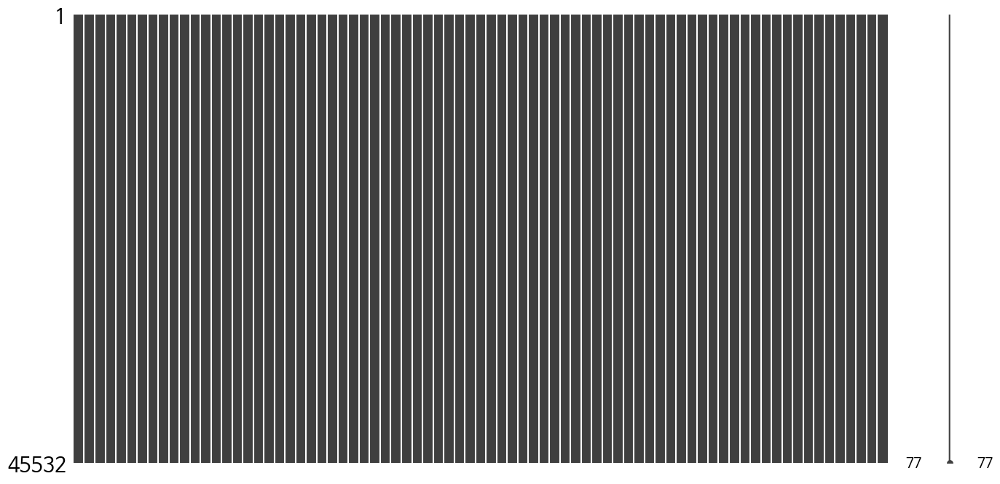

In [32]:
msno.matrix(train_df, figsize=(16,8))

In [33]:
etc_columns = []
QA_columns = []
QE_columns = []
tp_columns = []
wf_r_columns = []
for i in train_df.columns:
    if i[0] == 'Q':
        if i[-1] == 'A':
            QA_columns.append(i)
        else:
            QE_columns.append(i)
    elif i[0] == 't':
        tp_columns.append(i)
    elif i[0] == 'w':
        wf_r_columns.append(i)
    else:
        etc_columns.append(i)

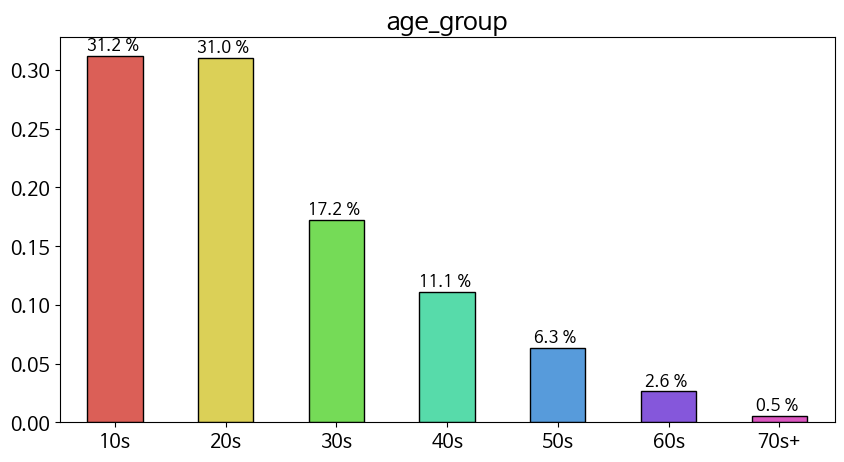

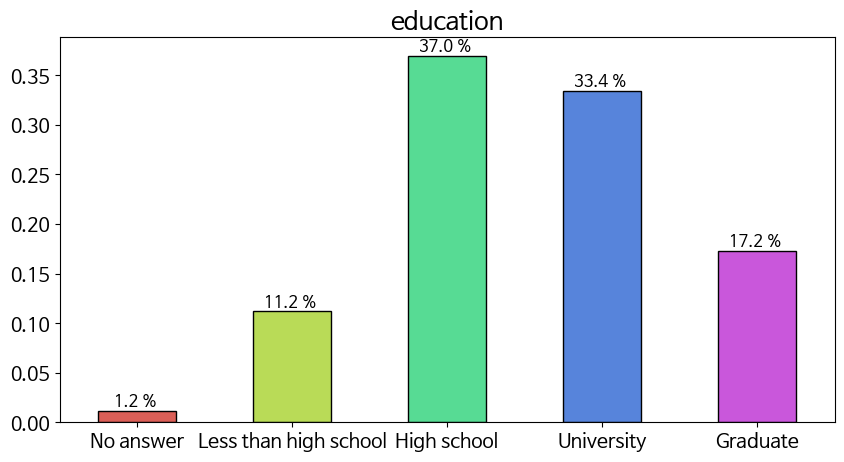

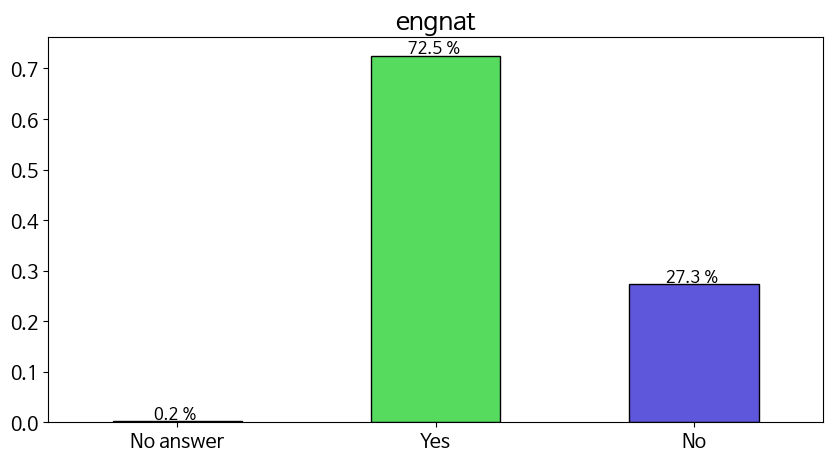

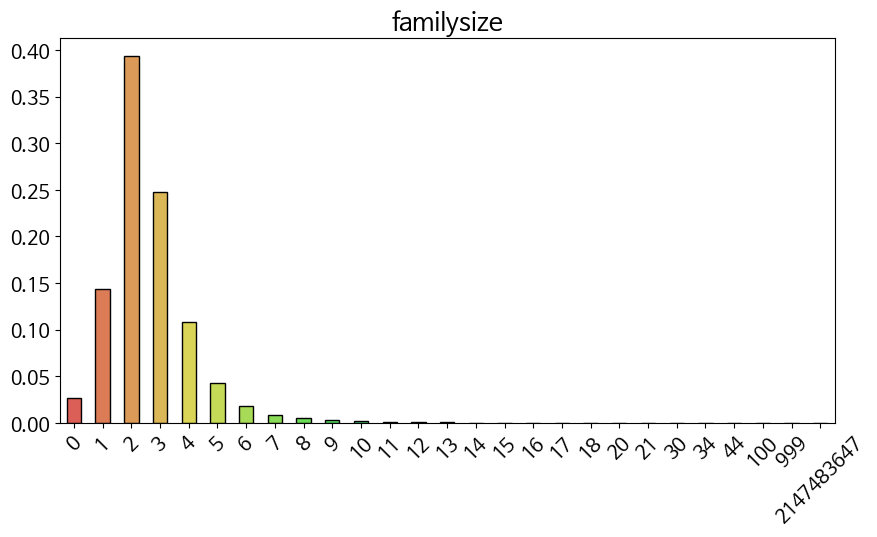

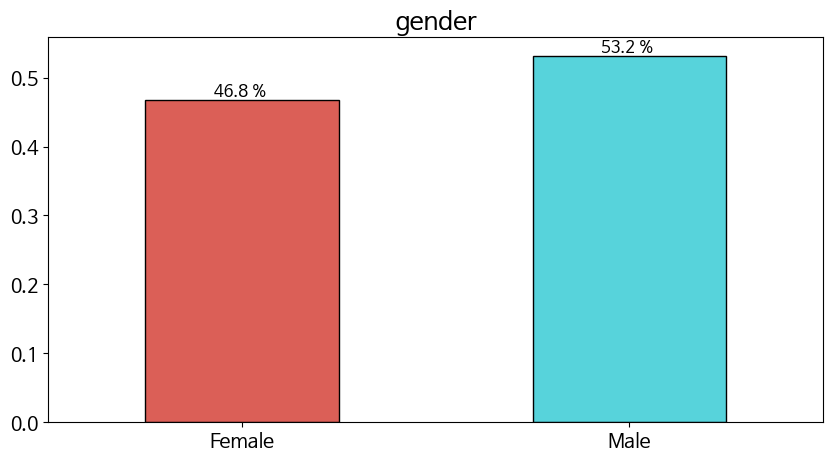

...

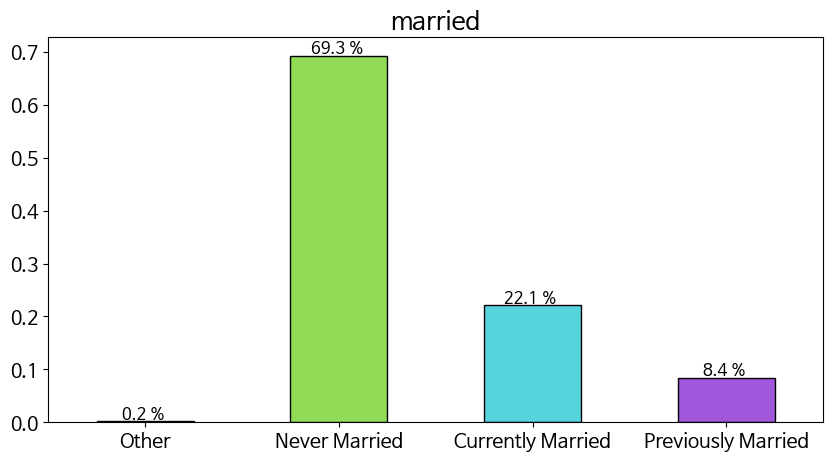

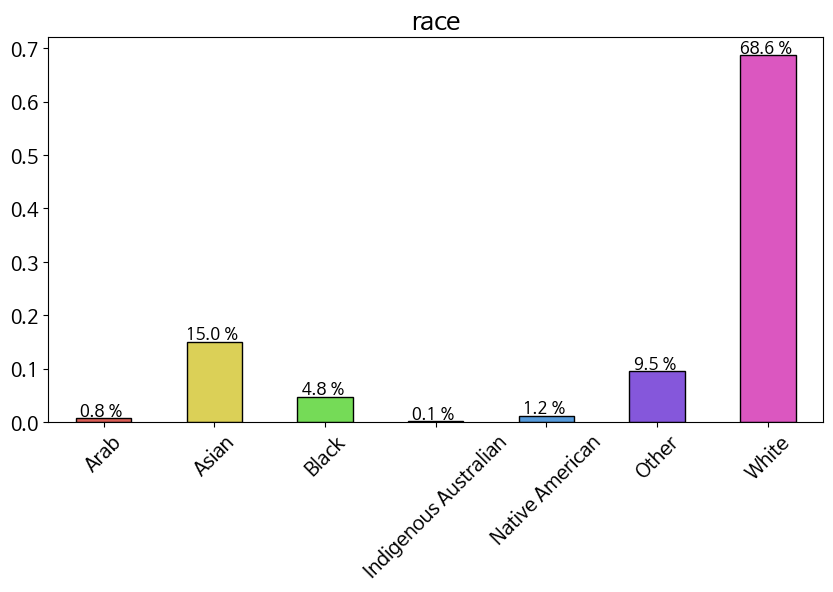

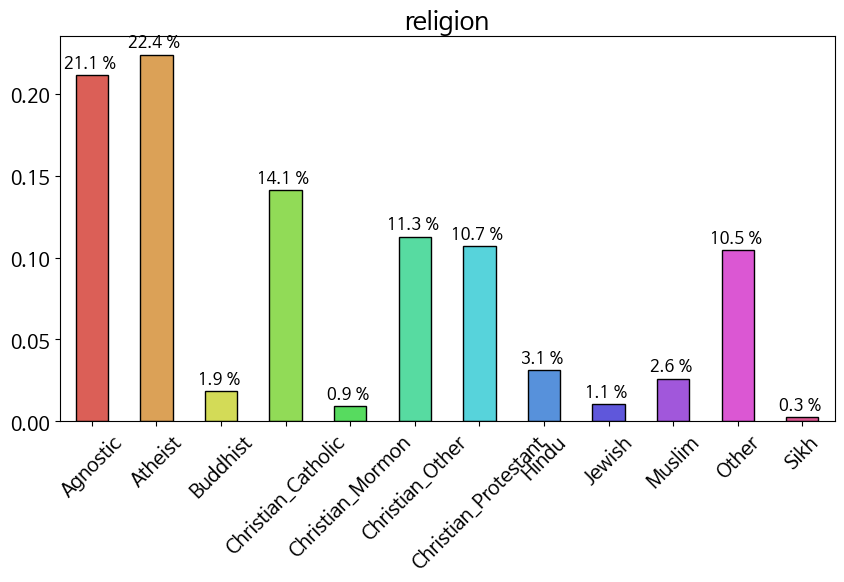

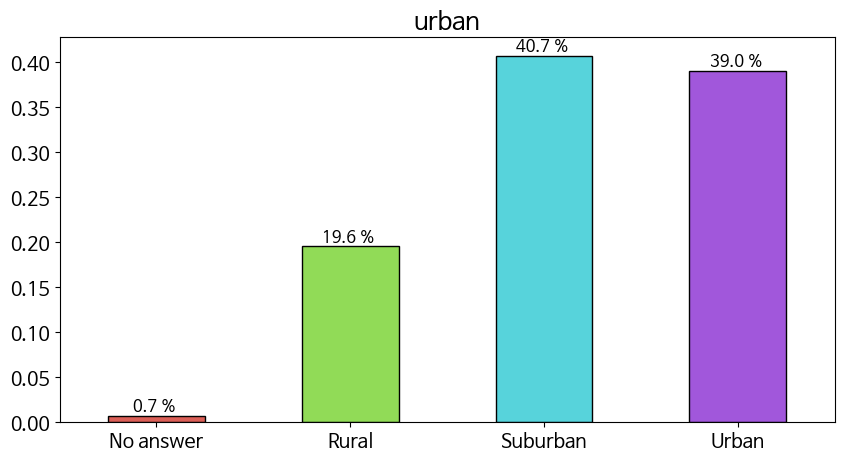

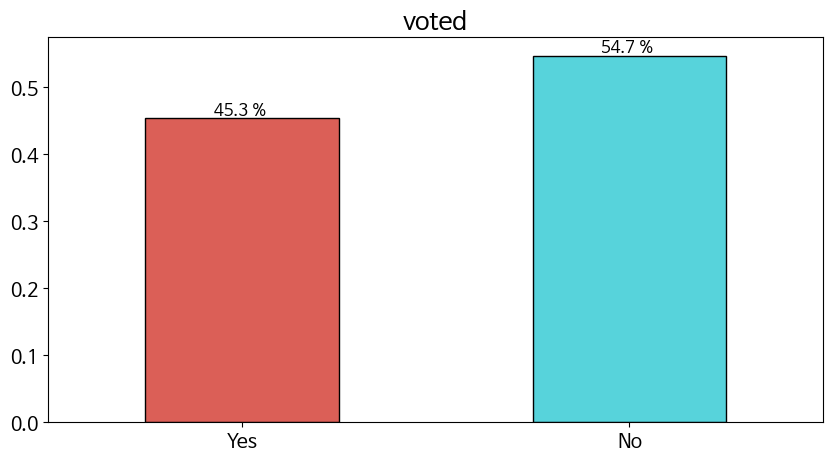

In [34]:
# Categorical Variables

edu_idx = ['No answer', 'Less than high school', 'High school', 'University', 'Graduate']
eng_idx = ['No answer', 'Yes', 'No']
hand_idx = ['No answer', 'Right', 'Left', 'Both']
mar_idx = ['Other', 'Never Married', 'Currently Married', 'Previously Married']
urban_idx = ['No answer', 'Rural', 'Suburban', 'Urban']
vot_idx = ['Yes', 'No']

for i in etc_columns:
    graphs_df = train_df[i].value_counts(normalize=True).sort_index()
    
    if i == 'education':
        xticks_col = edu_idx
    elif i == 'engnat':
        xticks_col = eng_idx
    elif i == 'hand':
        xticks_col = hand_idx
    elif i == 'married':
        xticks_col = mar_idx
    elif i == 'urban':
        xticks_col = urban_idx
    elif i == 'voted':
        xticks_col = vot_idx
    else:       
        xticks_col = list(graphs_df.index)
        
    if i == 'race' or i == 'religion' or i == 'familysize':
        rotat = 45
    else:
        rotat = 0
    
    plt.style.use("default")
    plt.figure(figsize=(10,5), facecolor="white")
    ax = graphs_df.plot(kind='bar', color=sns.color_palette('hls',len(graphs_df)), edgecolor='black')
    
    if i != 'familysize':
        for p in ax.patches:
            left, bottom, width, height = p.get_bbox().bounds
            ax.annotate("%.1f %% "%(height * 100), (left+width/2, height+0.005), ha='center', fontsize=12)
       
    plt.title(i, fontdict={'fontsize':18})
    plt.xticks(range(len(graphs_df.index)), xticks_col, fontsize=14, rotation=rotat)
    plt.yticks(fontsize=14)
    plt.show()

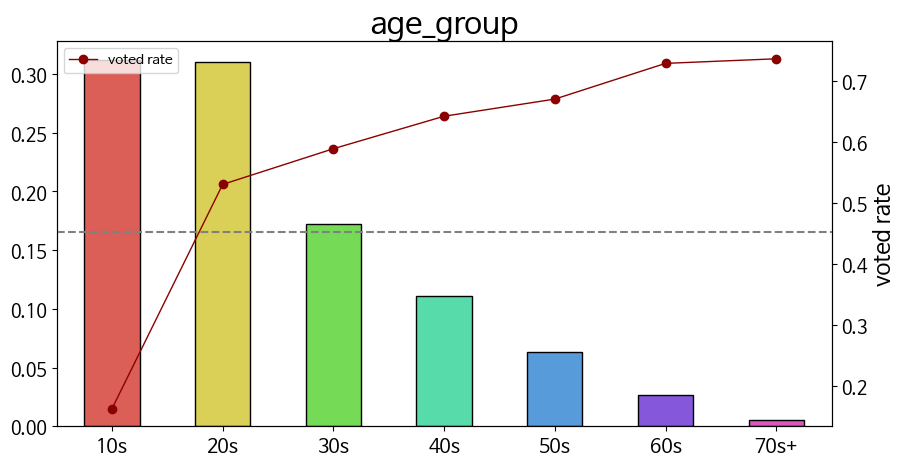

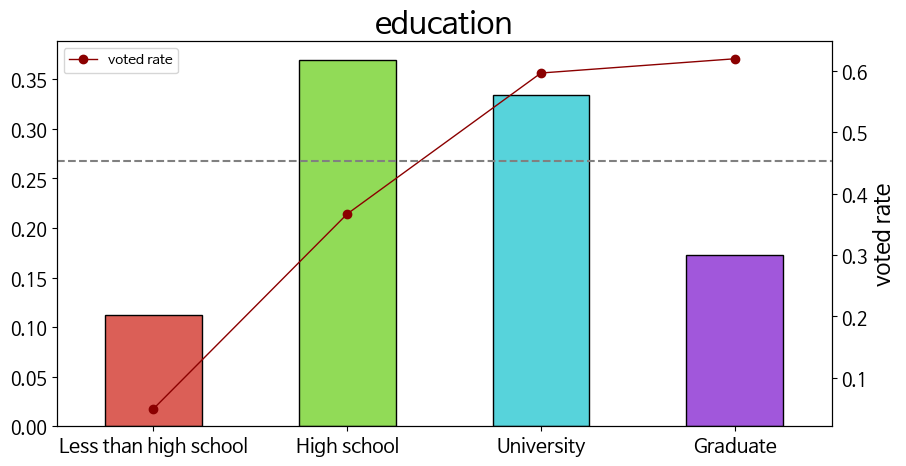

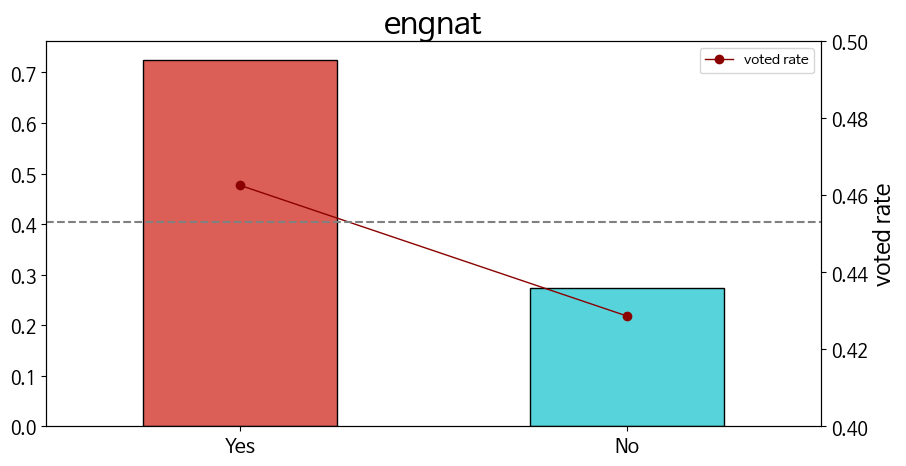

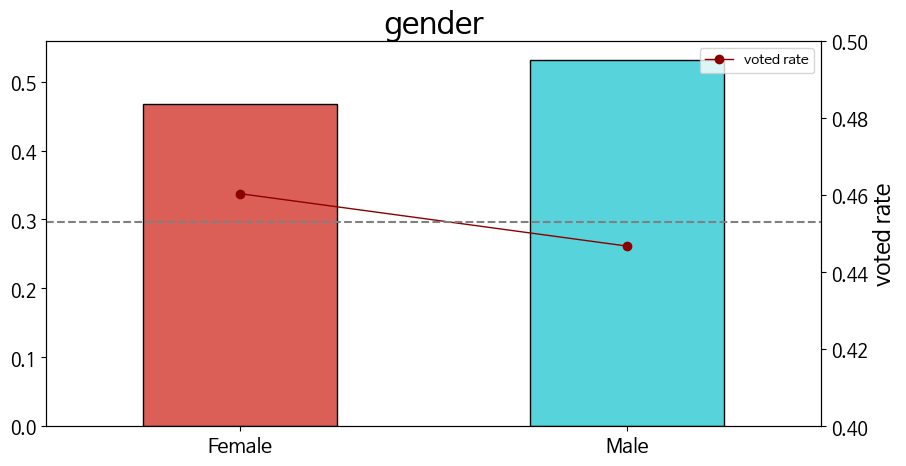

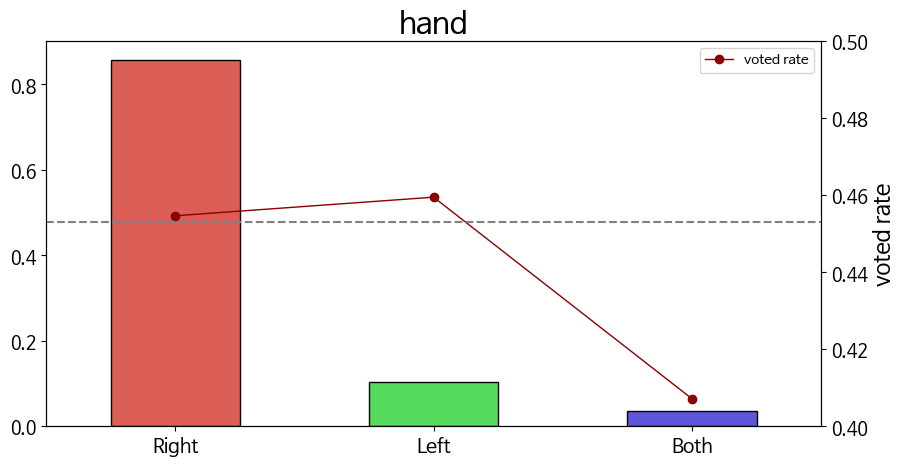

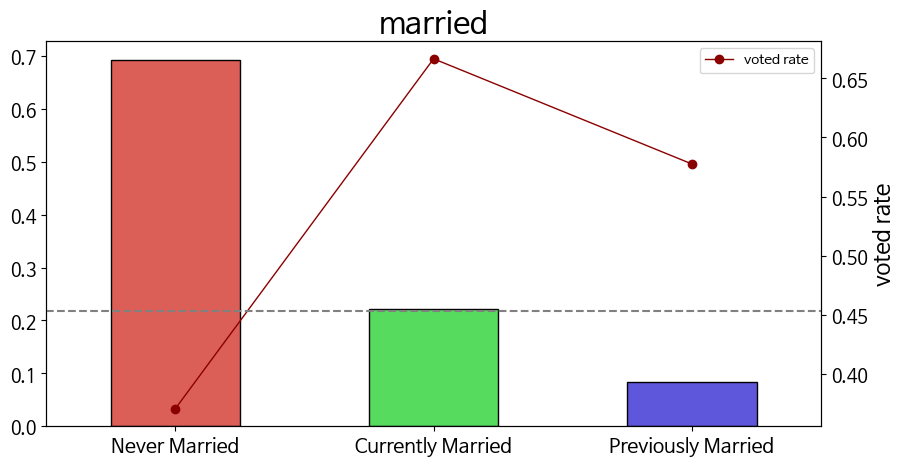

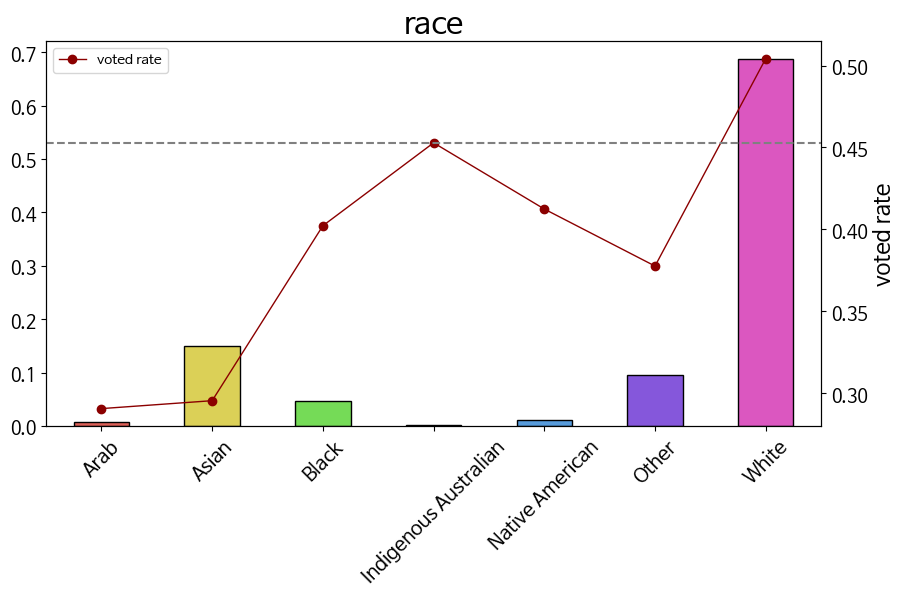

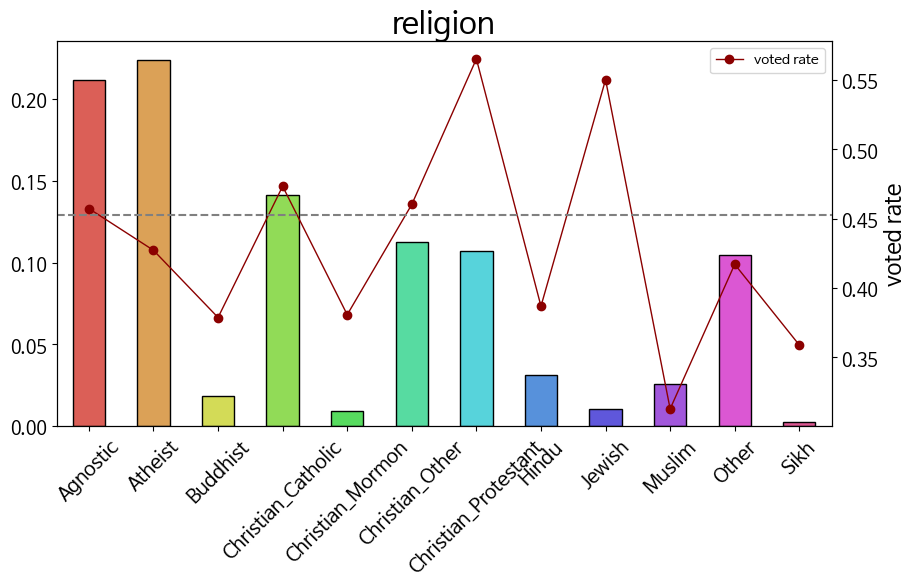

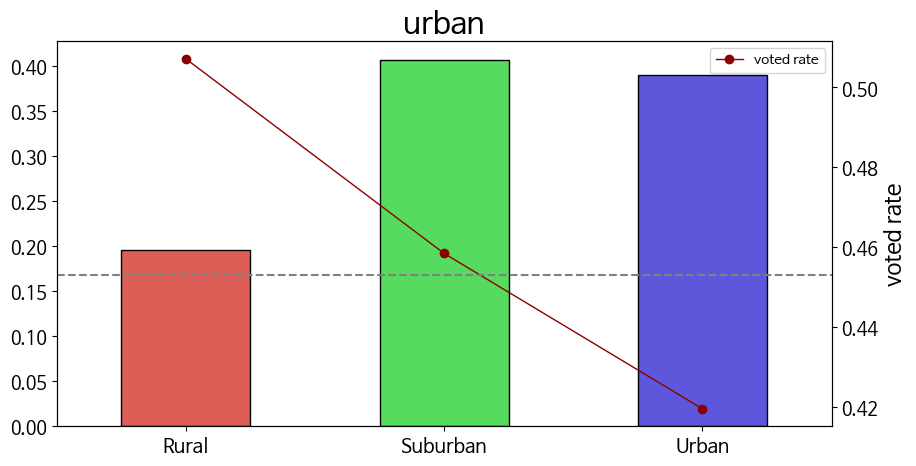

In [35]:
edu_idx = ['No answer', 'Less than high school', 'High school', 'University', 'Graduate']
eng_idx = ['No answer', 'Yes', 'No']
hand_idx = ['No answer', 'Right', 'Left', 'Both']
mar_idx = ['Other', 'Never Married', 'Currently Married', 'Previously Married']
urban_idx = ['No answer', 'Rural', 'Suburban', 'Urban']
vot_idx = ['Yes', 'No']

for i in etc_columns:
    if i != 'familysize' and i != 'voted':
        graphs_df = train_df[i].value_counts(normalize=True).sort_index()

        voted_list = []
        for j in graphs_df.index:
            voted_list.append(train_df[train_df[i] == j]['voted'].value_counts(normalize=True)[1])

        if i == 'education':
            xticks_col = edu_idx
        elif i == 'engnat':
            xticks_col = eng_idx
        elif i == 'hand':
            xticks_col = hand_idx
        elif i == 'married':
            xticks_col = mar_idx
        elif i == 'urban':
            xticks_col = urban_idx
        elif i == 'voted':
            xticks_col = vot_idx
        else:       
            xticks_col = list(graphs_df.index)
            
        if i == 'education' or i == 'engnat' or i == 'hand' or i == 'married' or i == 'urban':
            sub_num = 1
        else:
            sub_num = 0
            
        if i == 'race' or i == 'religion':
            rotat = 45
        else:
            rotat = 0
        
        plt.style.use("default")
        plt.figure(figsize=(10,5))
        plt.rcParams.update({'axes.labelsize': 16, 'axes.titlesize': 22, 'ytick.labelsize':13, 'xtick.labelsize':14})
        
        ax1 = graphs_df[sub_num:].plot(kind='bar', color=sns.color_palette('hls',len(graphs_df)-sub_num), edgecolor='black')    
        plt.title(i)
        plt.xticks(range(len(graphs_df.index)-sub_num), xticks_col[sub_num:], rotation=rotat)

        ax2 = ax1.twinx()
        plt.plot(range(len(graphs_df.index)-sub_num), voted_list[sub_num:], linewidth=1
                       , label='voted rate', color='darkred', marker='o')
        ax2.legend(loc='best')
        ax2.set_ylabel('voted rate')
        
        if i == 'engnat' or i == 'gender' or i == 'hand':
            ax2.set_ylim(0.4, 0.5)
        plt.axhline(y=0.453, color='grey', linewidth=1.5, linestyle='--')

        plt.show()

In [48]:
graphs_df[:16]

0     0.026728
1     0.143525
2     0.393525
3     0.247211
4     0.107770
5     0.043091
6     0.018405
7     0.008500
8     0.004854
9     0.002767
10    0.001296
11    0.000857
12    0.000461
13    0.000242
14    0.000198
15    0.000176
Name: familysize, dtype: float64

In [49]:
xtick_col

Int64Index([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15], dtype='int64')

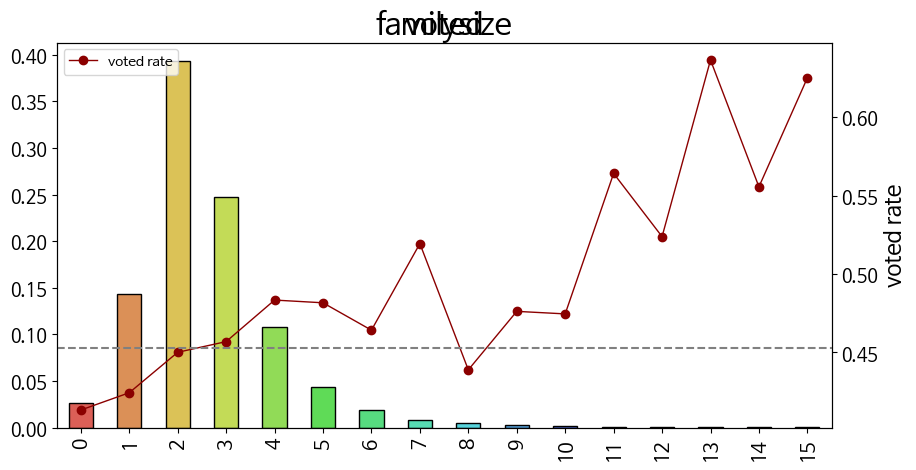

In [56]:
graphs_df = train_df['familysize'].value_counts(normalize=True).sort_index()

xtick_col = graphs_df.index[:16]

voted_list = []
for j in graphs_df.index:
    if j < 16:
        voted_list.append(train_df[train_df['familysize'] == j]['voted'].value_counts(normalize=True)[1])

rotat = 0
        
plt.style.use("default")
plt.figure(figsize=(10,5))
plt.rcParams.update({'axes.labelsize': 16, 'axes.titlesize': 22, 'ytick.labelsize':13, 'xtick.labelsize':14})

ax1 = graphs_df[:16].plot(kind='bar', color=sns.color_palette('hls',len(graphs_df[:16])), edgecolor='black')    
plt.title(i)
# plt.xticks(range(16), xticks_col, rotation=rotat)

ax2 = ax1.twinx()
plt.plot(range(len(graphs_df[:16].index)), voted_list, linewidth=1
               , label='voted rate', color='darkred', marker='o')
ax2.legend(loc='best')
ax2.set_ylabel('voted rate')

plt.axhline(y=0.453, color='grey', linewidth=1.5, linestyle='--')

plt.title('familysize')
plt.show()

In [42]:
graphs_df.index[:16]

Int64Index([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15], dtype='int64')

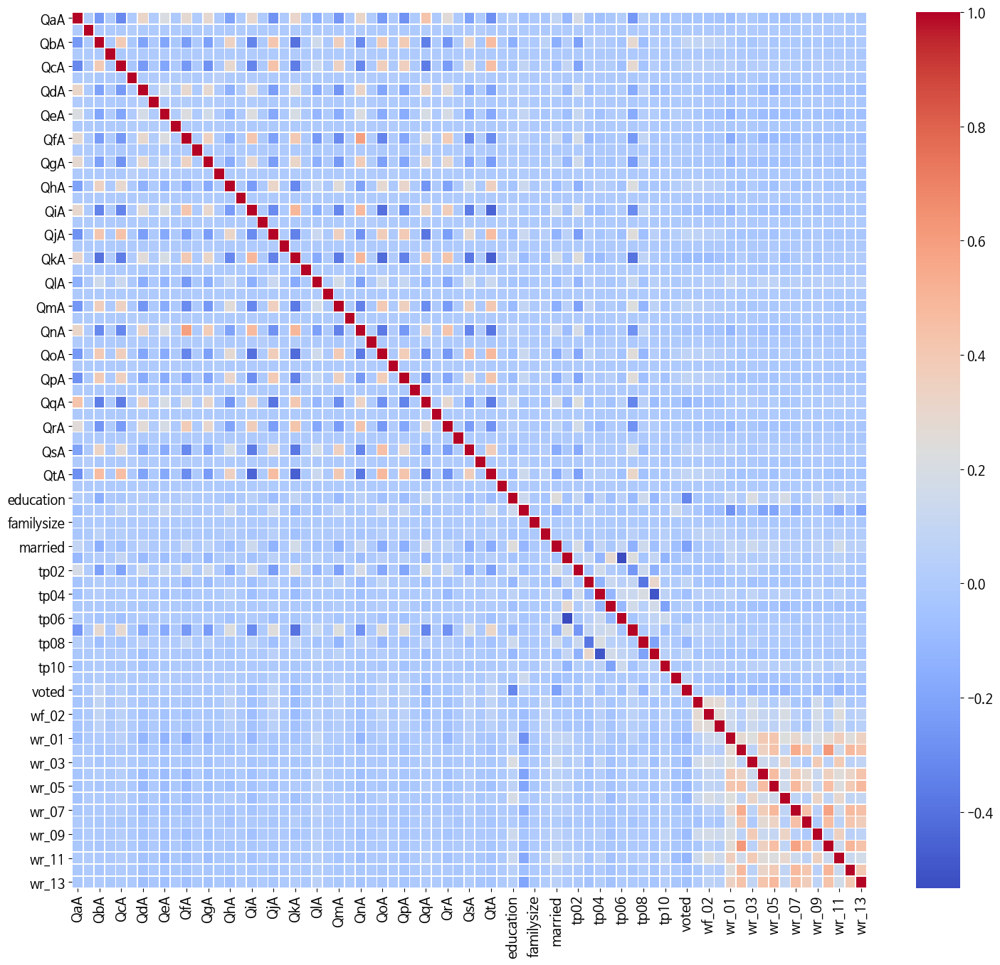

In [59]:
df_corr = train_df.corr()
plt.figure(figsize=(18,16))
sns.heatmap(df_corr, linewidths=.5, cmap='coolwarm')
plt.show()

In [ ]:
train_df[QA_columns+QE_columns]

,QaA,QbA,QcA,QdA,QeA,QfA,QgA,QhA,QiA,QjA,QkA,QlA,QmA,QnA,QoA,QpA,QqA,QrA,QsA,QtA,QaE,QbE,QcE,QdE,QeE,QfE,QgE,QhE,QiE,QjE,QkE,QlE,QmE,QnE,QoE,QpE,QqE,QrE,QsE,QtE
0,3.0,4.0,5.0,1.0,2.0,5.0,2.0,4.0,5.0,4.0,4.0,4.0,2.0,5.0,2.0,2.0,2.0,2.0,2.0,1.0,363,1370,997,1024,1577,539,586,1095,1142,1287,883,851,851,816,579,924,366,876,633,1115
1,5.0,5.0,3.0,5.0,1.0,3.0,1.0,1.0,5.0,3.0,5.0,4.0,1.0,5.0,1.0,5.0,5.0,1.0,4.0,1.0,647,1313,3387,2969,4320,2190,826,4082,1867,1264,2943,3927,4329,1828,1214,2414,1356,3039,4304,1346
2,4.0,1.0,1.0,4.0,5.0,1.0,4.0,1.0,3.0,2.0,5.0,5.0,2.0,4.0,2.0,1.0,5.0,4.0,1.0,1.0,1623,1480,1021,3374,1333,531,1167,1016,2653,1569,998,2547,918,2153,1304,1131,937,1327,1170,1409
3,3.0,3.0,4.0,3.0,1.0,2.0,4.0,3.0,5.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,5.0,504,2311,992,3245,357,1519,159,2275,2809,5614,3219,1296,9046,1216,1169,23868,581,8830,2392,1312
4,1.0,1.0,5.0,2.0,1.0,2.0,1.0,1.0,5.0,5.0,5.0,5.0,4.0,2.0,1.0,4.0,5.0,5.0,1.0,2.0,927,707,556,1062,1014,628,991,1259,1153,1388,740,1181,547,575,754,1140,323,1070,583,1889
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45527,2.0,5.0,4.0,1.0,1.0,1.0,1.0,1.0,1.0,4.0,4.0,5.0,4.0,1.0,2.0,4.0,2.0,1.0,5.0,4.0,1050,619,328,285,602,267,315,483,1016,278,611,215,388,299,1915,439,823,309,586,2252
45528,2.0,3.0,4.0,1.0,3.0,2.0,2.0,1.0,2.0,5.0,2.0,5.0,3.0,2.0,4.0,4.0,2.0,3.0,4.0,4.0,581,1353,1164,798,1680,560,640,1415,4494,1392,2478,1268,843,1401,1524,719,754,1118,654,1197
45529,4.0,1.0,1.0,4.0,5.0,4.0,5.0,1.0,5.0,1.0,5.0,5.0,1.0,4.0,1.0,1.0,5.0,5.0,3.0,1.0,593,857,1047,1515,1690,1253,1094,1283,2209,1764,1062,1489,1908,891,1298,1200,473,1779,1355,667
45530,1.0,3.0,4.0,2.0,1.0,1.0,1.0,1.0,5.0,1.0,5.0,5.0,4.0,3.0,1.0,1.0,4.0,4.0,4.0,1.0,747,1331,892,1281,1328,599,650,1429,1748,770,1025,742,4180,707,489,913,1301,1680,737,1124


In [57]:
QAQE_df = train_df[QA_columns+QE_columns]
QAQE_df.describe()

,QaA,QbA,QcA,QdA,QeA,QfA,QgA,QhA,QiA,QjA,QkA,QlA,QmA,QnA,QoA,QpA,QqA,QrA,QsA,QtA,QaE,QbE,QcE,QdE,QeE,QfE,QgE,QhE,QiE,QjE,QkE,QlE,QmE,QnE,QoE,QpE,QqE,QrE,QsE,QtE
count,45532.000000,45532.000000,45532.000000,45532.000000,45532.000000,45532.000000,45532.000000,45532.000000,45532.000000,45532.000000,45532.000000,45532.000000,45532.000000,45532.000000,45532.000000,45532.000000,45532.000000,45532.000000,45532.000000,45532.000000,4.553200e+04,4.553200e+04,45532.000000,4.553200e+04,4.553200e+04,4.553200e+04,4.553200e+04,4.553200e+04,4.553200e+04,4.553200e+04,4.553200e+04,4.553200e+04,4.553200e+04,45532.000000,4.553200e+04,4.553200e+04,4.553200e+04,4.553200e+04,4.553200e+04,4.553200e+04
mean,2.129535,2.904463,3.662347,1.749078,2.317952,2.168145,2.560595,2.317952,3.157691,3.575529,3.813933,4.325727,3.509620,2.632896,3.217232,3.071752,2.840464,2.823487,3.432948,3.225687,9.453570e+02,2.189589e+03,1484.294518,1.490672e+03,1.899292e+03,1.850650e+03,1.284608e+03,4.584272e+03,4.068434e+03,2.576363e+03,2.038986e+03,3.741018e+03,2.050287e+03,959.880502,1.435762e+03,1.633479e+03,1.154352e+03,2.470808e+03,1.164117e+03,2.240057e+03
std,1.196952,1.566142,1.431494,1.043625,1.369205,1.348653,1.510600,1.460813,1.481740,1.361220,1.372551,1.146992,1.375134,1.473022,1.476414,1.489744,1.404342,1.424383,1.374938,1.521603,1.307565e+04,3.351027e+04,8977.664318,1.092260e+04,1.670765e+04,7.608236e+04,9.756584e+03,5.020265e+05,1.141738e+05,5.411432e+04,3.069164e+04,3.663672e+05,7.530787e+04,5869.964127,1.084997e+04,2.600221e+04,2.250689e+04,1.482890e+05,7.433515e+03,6.730924e+04
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.500000e+01,2.500000e+01,25.000000,2.600000e+01,2.500000e+01,2.500000e+01,2.500000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.500000e+01,2.500000e+01,25.000000,0.000000e+00,0.000000e+00,0.000000e+00,2.500000e+01,2.500000e+01,2.500000e+01
25%,1.000000,1.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,2.000000,3.000000,4.000000,2.000000,1.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,4.040000e+02,8.750000e+02,651.000000,6.790000e+02,8.340000e+02,5.040000e+02,5.490000e+02,1.077000e+03,1.259000e+03,9.020000e+02,8.590000e+02,8.060000e+02,6.500000e+02,428.000000,6.380000e+02,7.060000e+02,4.610000e+02,7.940000e+02,5.270000e+02,7.330000e+02
50%,2.000000,3.000000,4.000000,1.000000,2.000000,2.000000,2.000000,2.000000,3.000000,4.000000,4.000000,5.000000,4.000000,2.000000,4.000000,3.000000,3.000000,3.000000,4.000000,4.000000,5.570000e+02,1.218000e+03,899.000000,9.310000e+02,1.154000e+03,7.120000e+02,7.720000e+02,1.464000e+03,1.800000e+03,1.260000e+03,1.178000e+03,1.125000e+03,9.060000e+02,596.000000,8.830000e+02,9.700000e+02,6.520000e+02,1.117000e+03,7.470000e+02,1.020000e+03
75%,3.000000,4.000000,5.000000,2.000000,3.000000,3.000000,4.000000,4.000000,5.000000,5.000000,5.000000,5.000000,5.000000,4.000000,5.000000,4.000000,4.000000,4.000000,5.000000,5.000000,8.270000e+02,1.838000e+03,1335.000000,1.355000e+03,1.656000e+03,1.078000e+03,1.150000e+03,2.090000e+03,2.761000e+03,1.899000e+03,1.721000e+03,1.649000e+03,1.342000e+03,891.000000,1.300000e+03,1.409000e+03,9.820000e+02,1.664000e+03,1.124000e+03,1.526000e+03
max,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,2.413960e+06,5.580395e+06,871557.000000,1.552821e+06,1.919926e+06,1.176370e+07,1.068252e+06,1.070860e+08,1.703586e+07,9.910006e+06,4.824953e+06,7.754351e+07,1.410832e+07,606694.000000,1.309739e+06,4.650742e+06,4.277510e+06,3.159328e+07,1.286581e+06,1.155650e+07


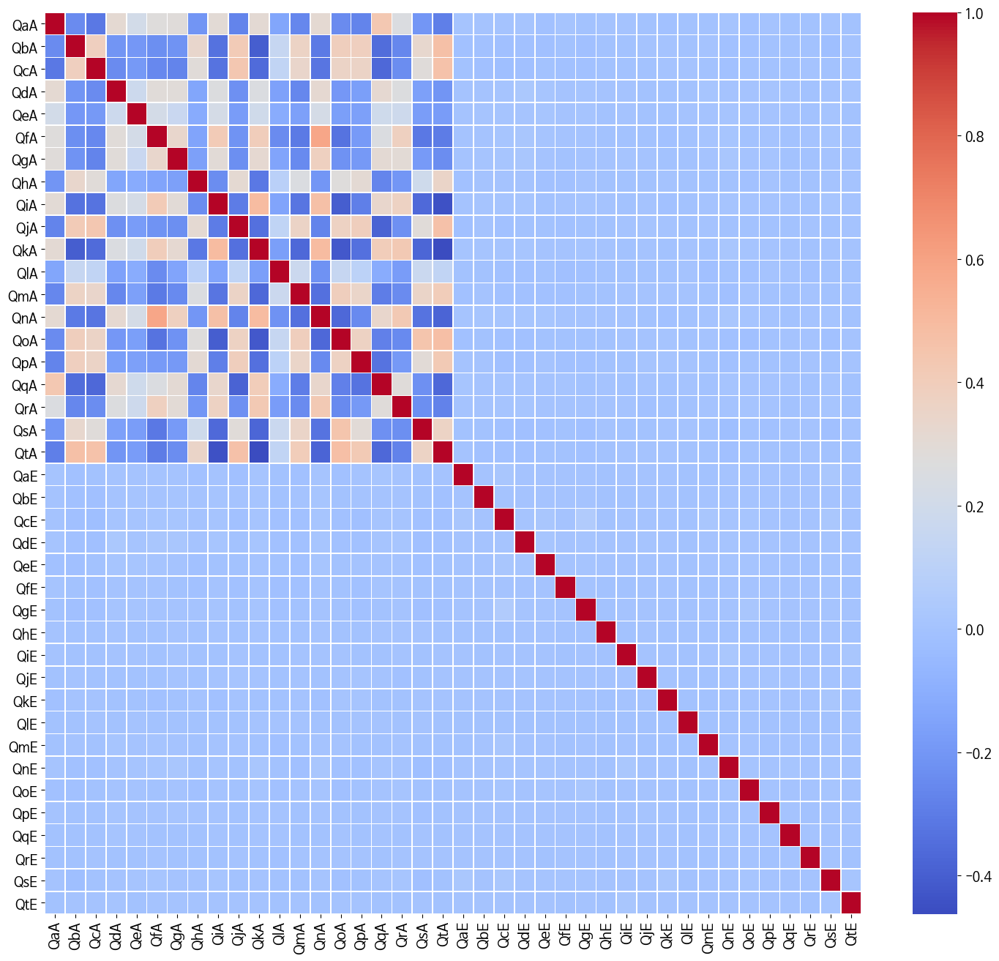

In [58]:
df_corr = QAQE_df.corr()
plt.figure(figsize=(18,16))
sns.heatmap(df_corr, linewidths=.5, cmap='coolwarm')
plt.show()

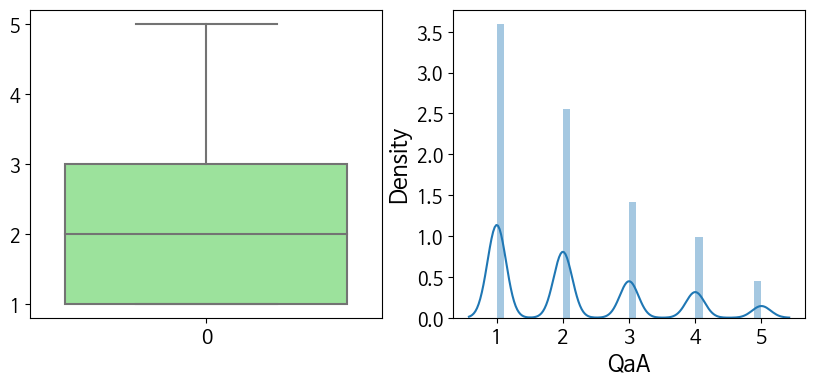

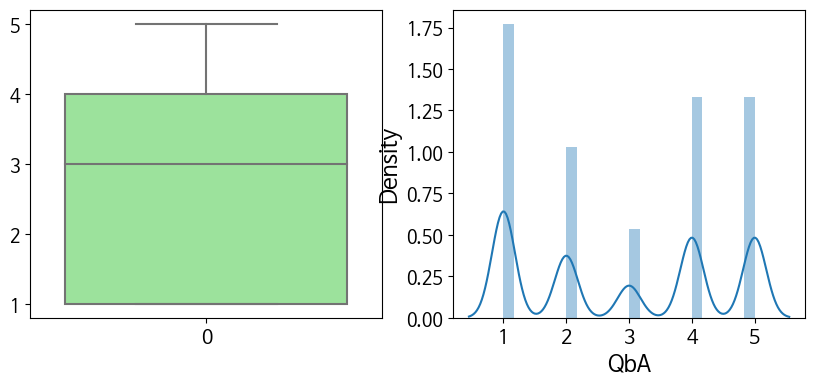

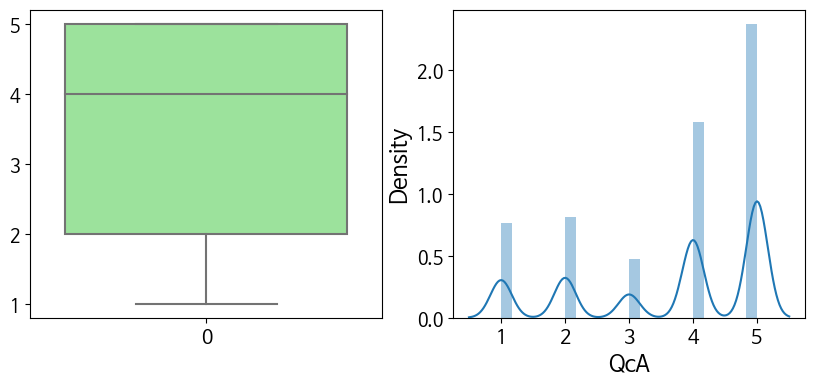

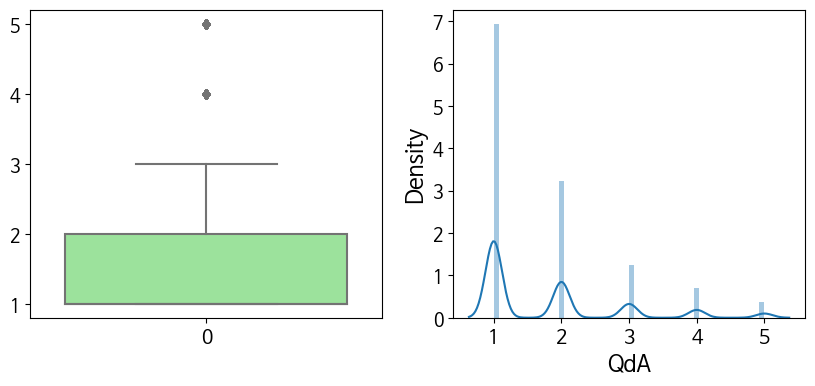

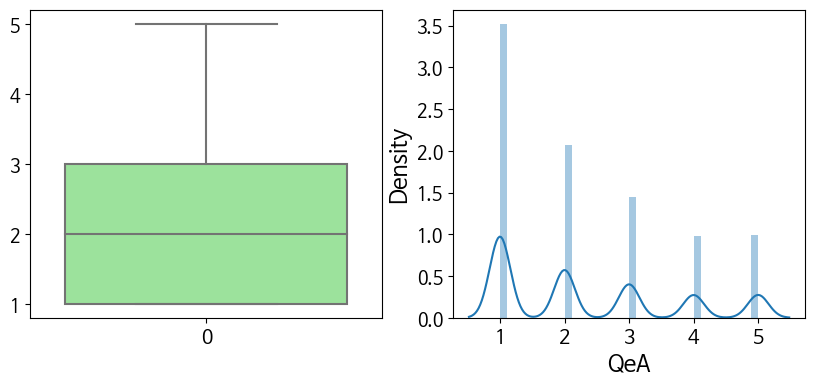

...

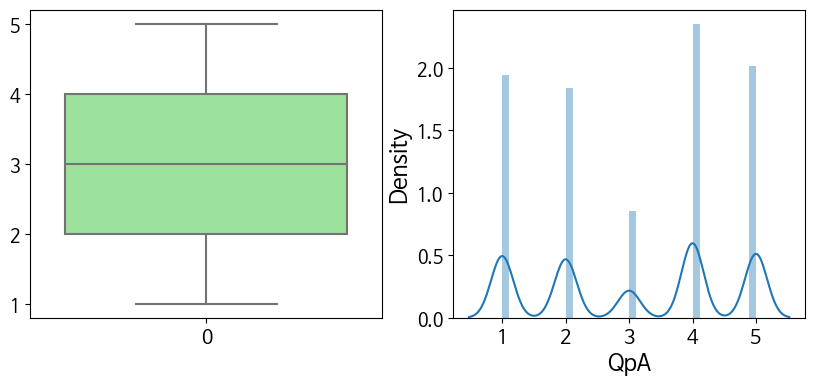

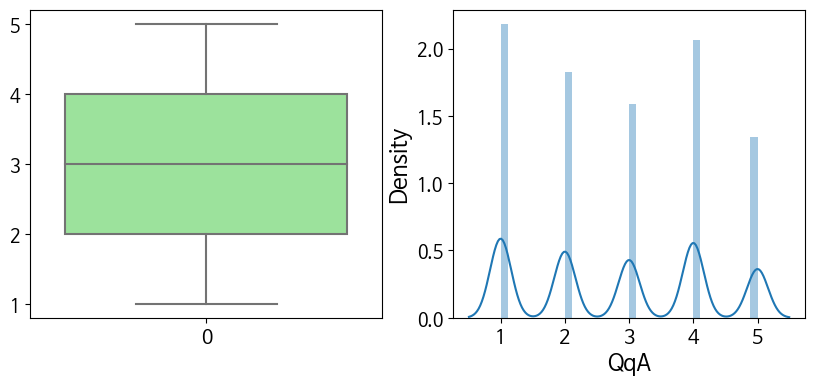

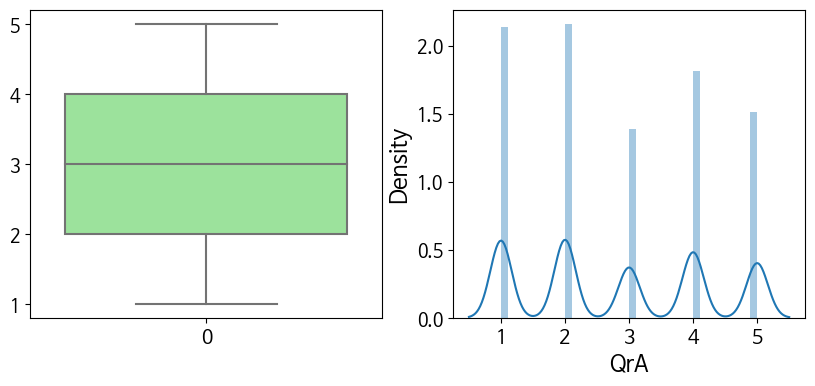

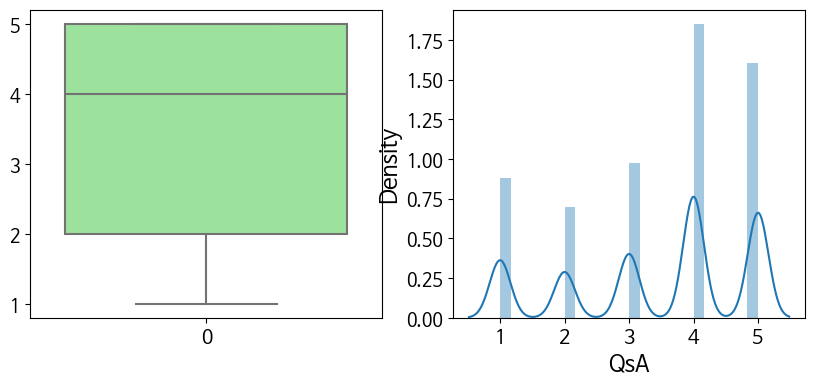

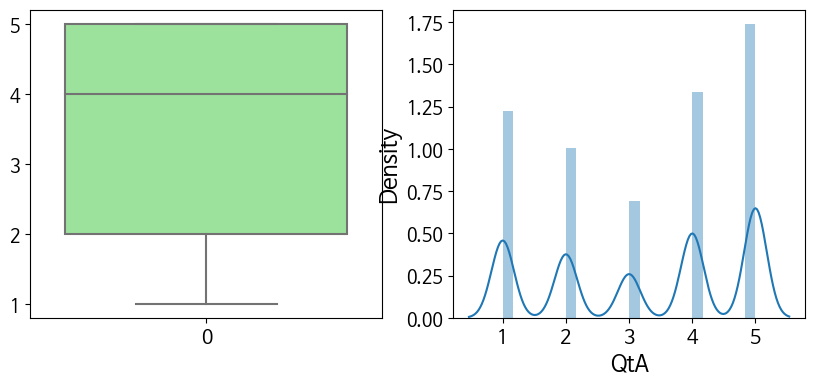

In [ ]:
for i in QA_columns:
    
    fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2)
    fig.set_size_inches(10,4)
    
    sns.boxplot(data=train_df[i], color='lightgreen', ax=ax1)
    sns.distplot(train_df.loc[train_df[i].notnull(), i], ax=ax2)

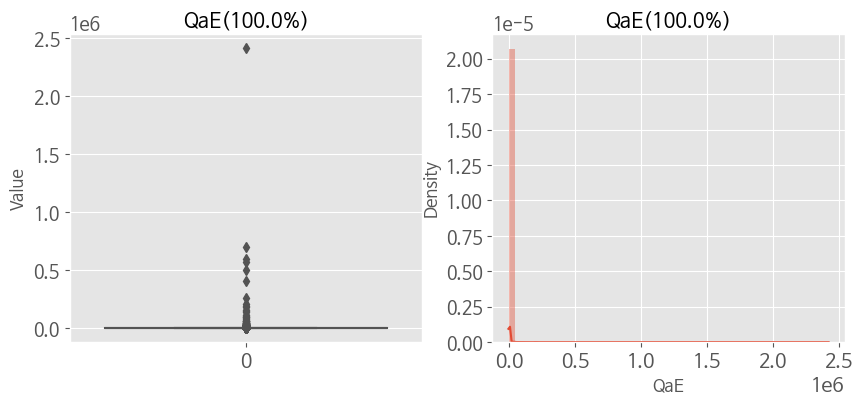

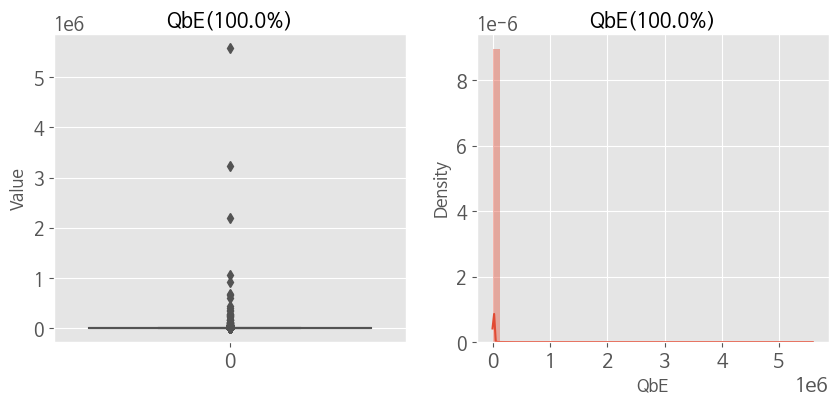

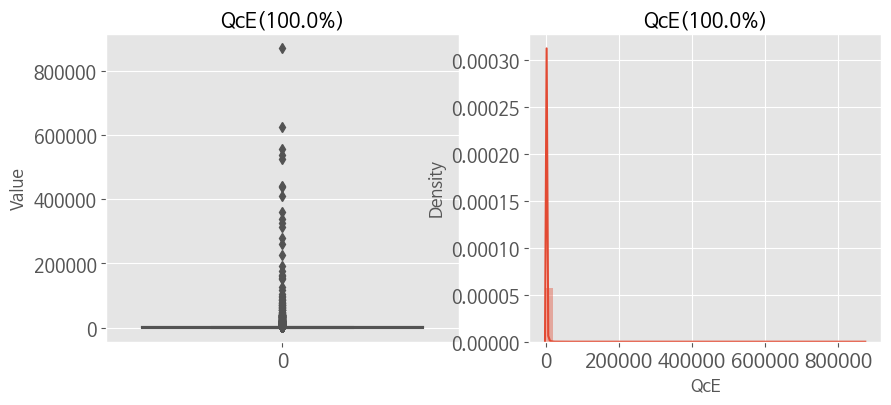

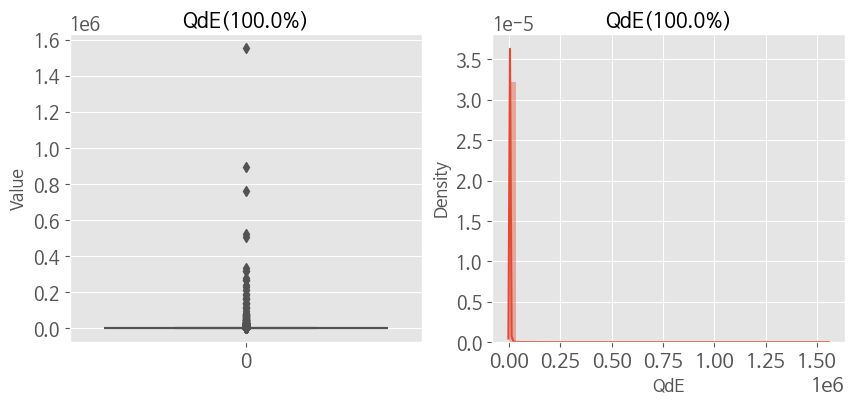

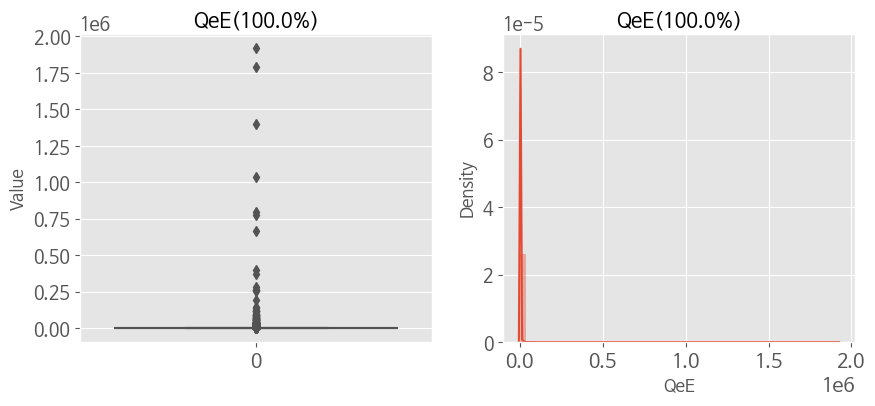

...

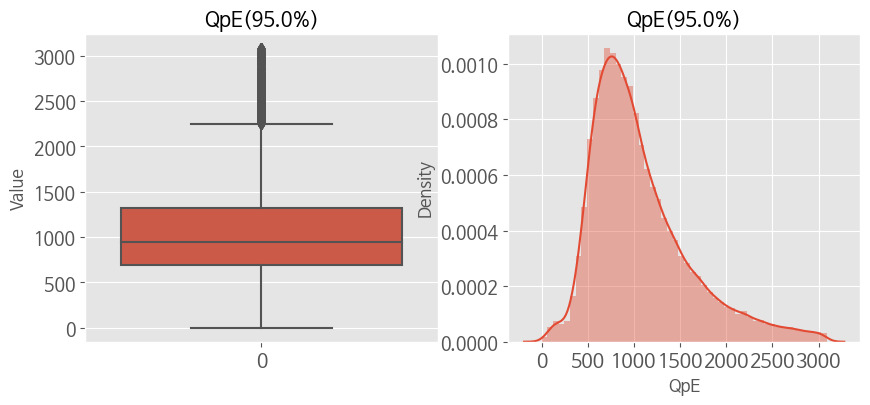

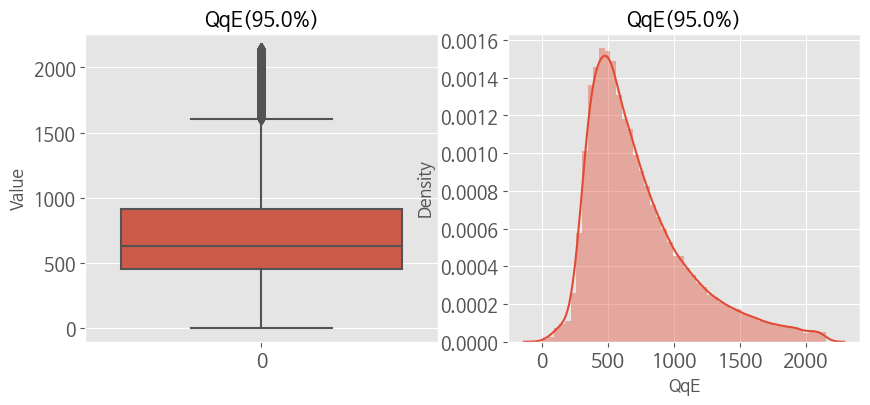

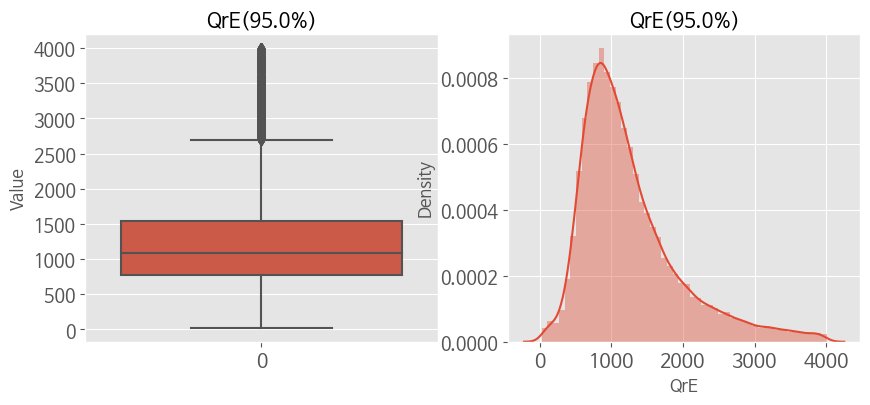

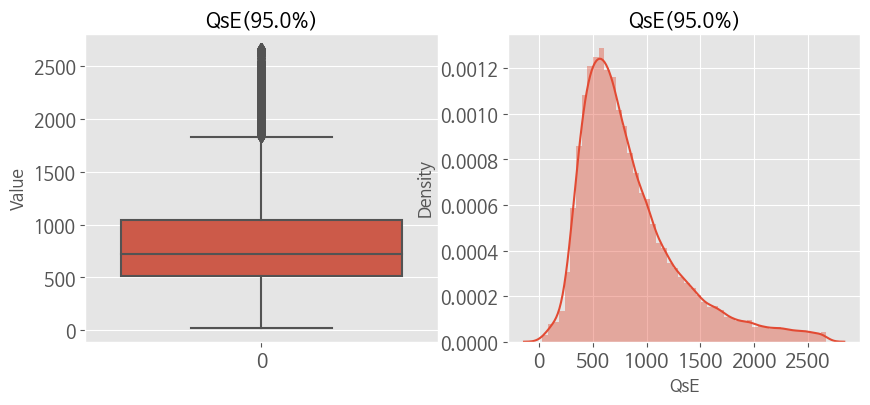

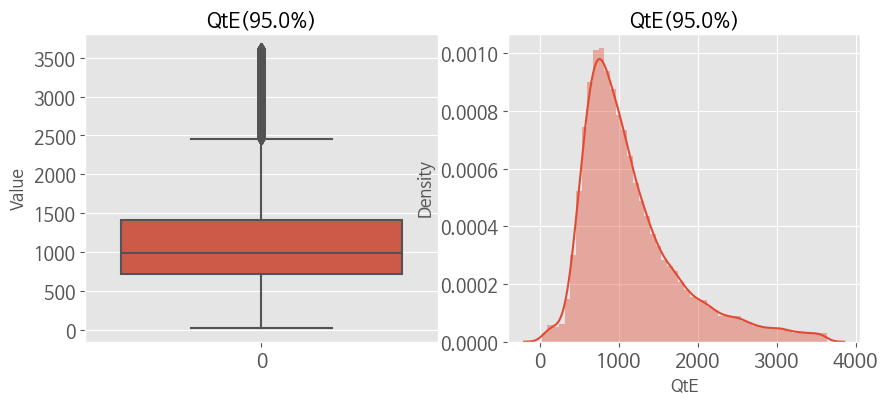

In [ ]:
for num in [0, 0.001, 0.01, 0.05]:
    for i in QE_columns:
        
        plt.style.use("ggplot")
    
        boxplot_df = train_df[i].copy()
        data = boxplot_df[boxplot_df <= boxplot_df.quantile(1-num)]

        fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2)
        fig.set_size_inches(10,4)

        sns.boxplot(data=data, ax=ax1)
        sns.distplot(data, ax=ax2)
        
        ax1.set(ylabel='Value',title="{0}({1:0.1f}%)".format(i, (1-num)*100))
        ax2.set(ylabel='Density',title="{0}({1:0.1f}%)".format(i, (1-num)*100))        
        
sns.reset_defaults()

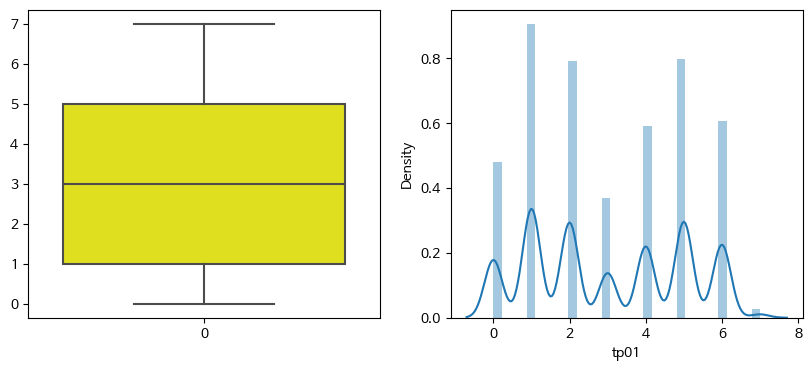

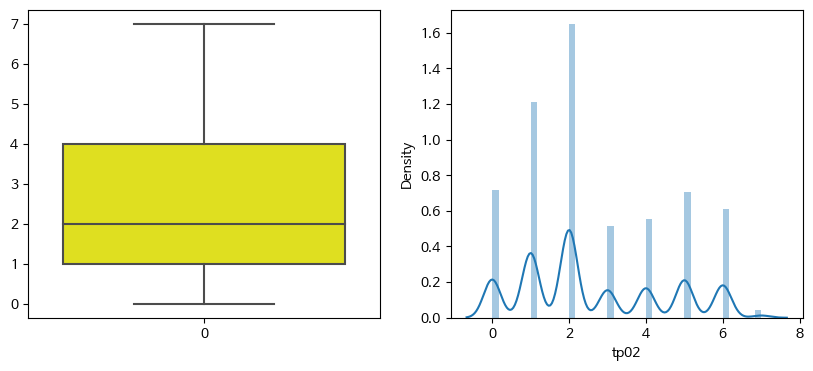

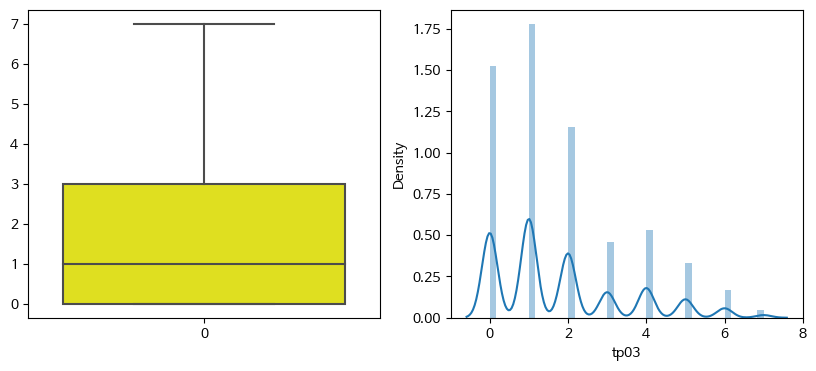

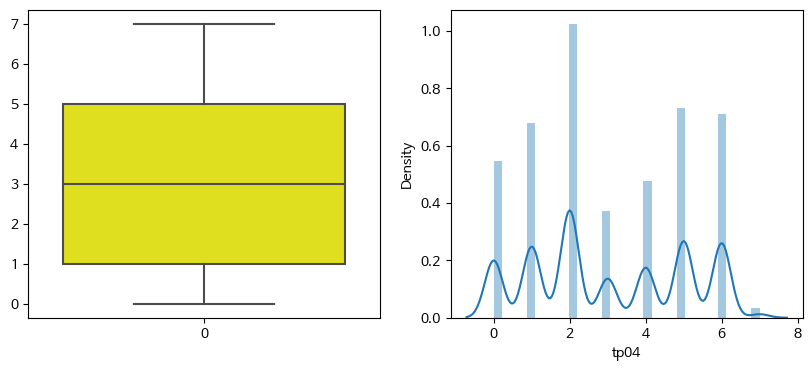

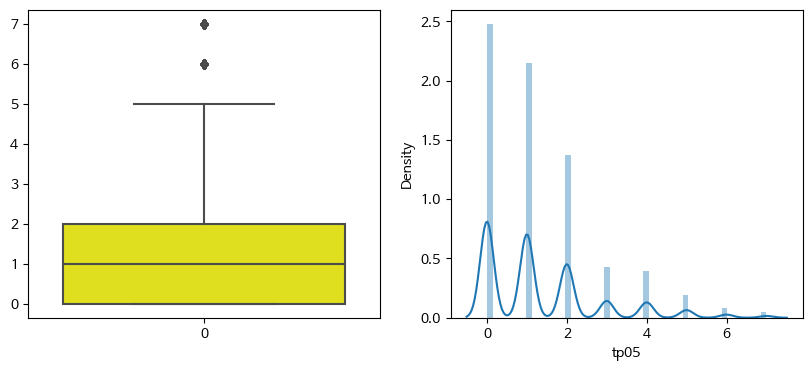

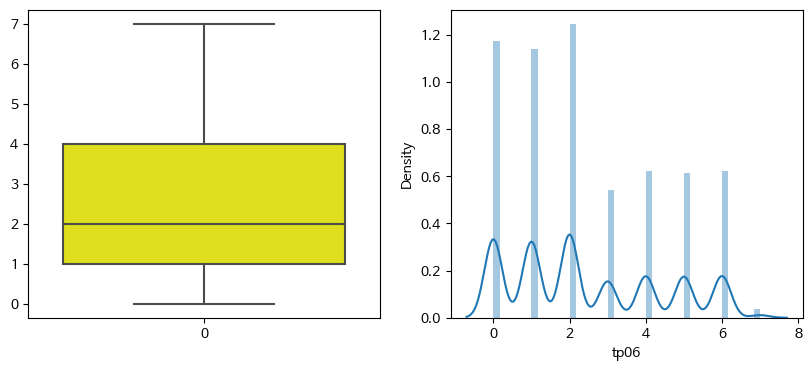

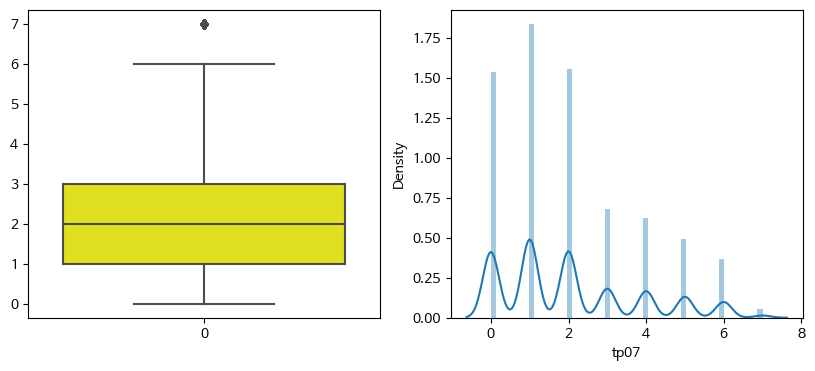

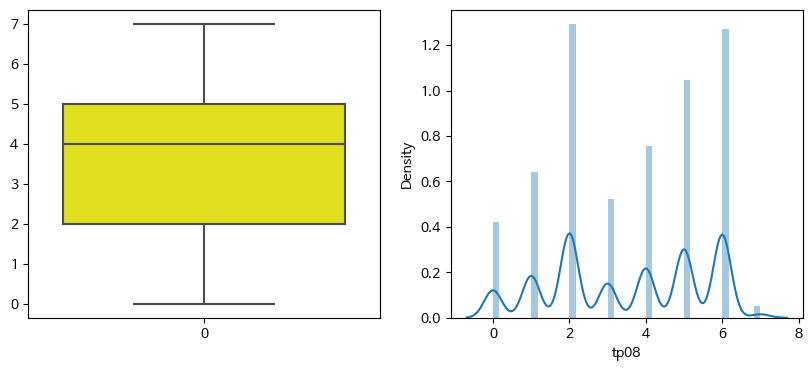

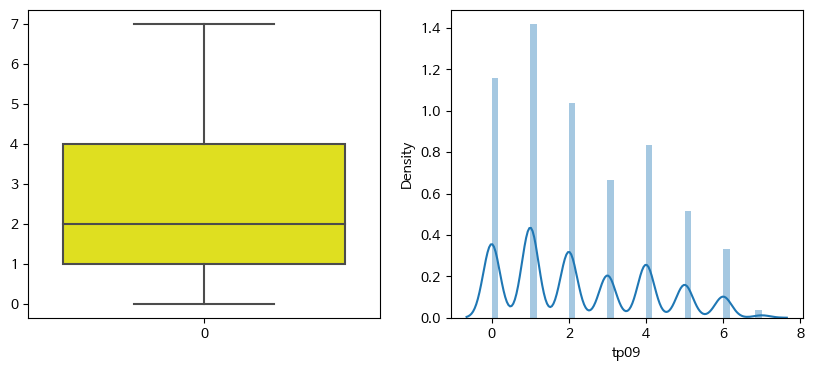

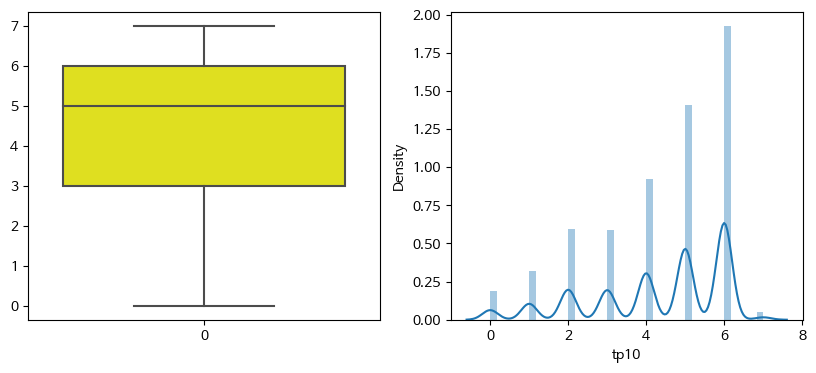

In [ ]:
for i in tp_columns:
    fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2)
    fig.set_size_inches(10,4)
    
    sns.boxplot(data=train_df[i], color='yellow', ax=ax1)
    sns.distplot(train_df.loc[train_df[i].notnull(), i], ax=ax2)

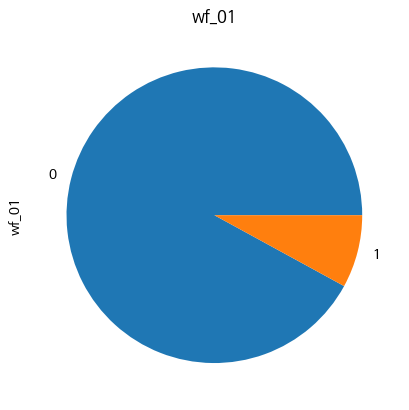

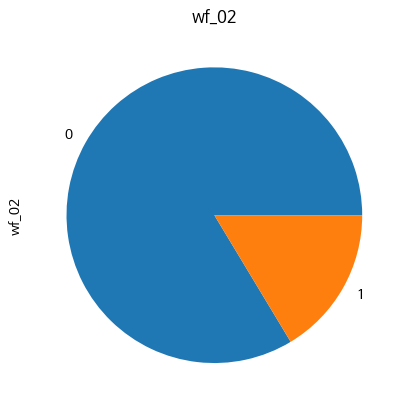

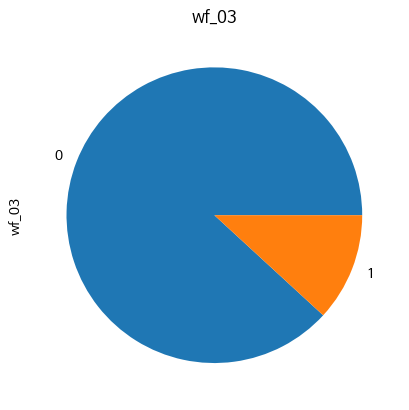

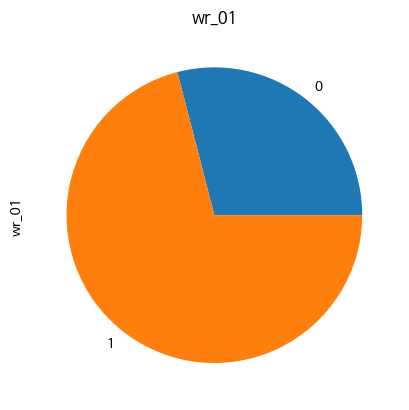

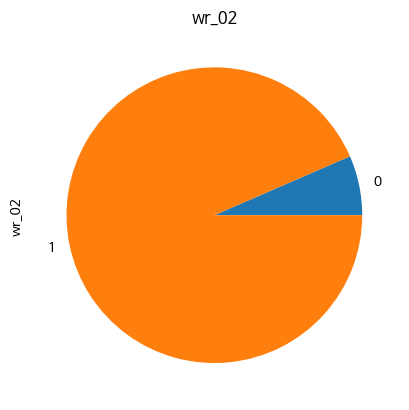

...

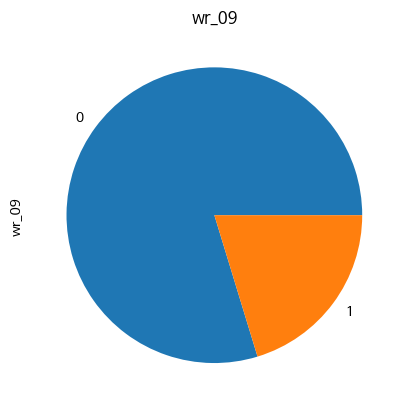

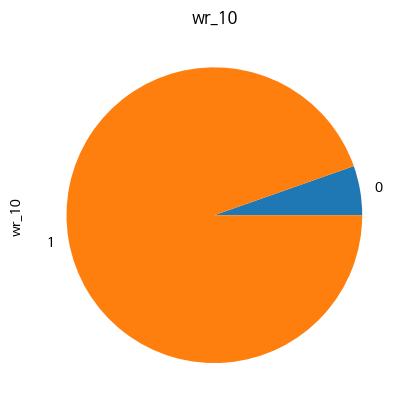

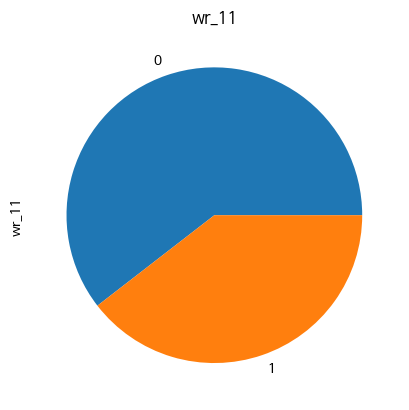

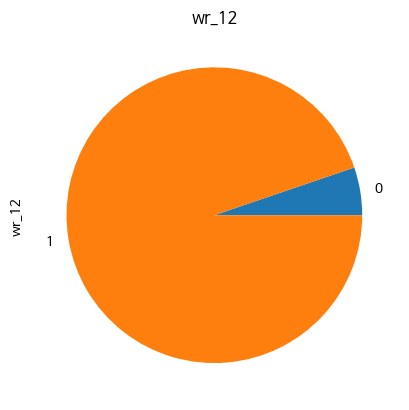

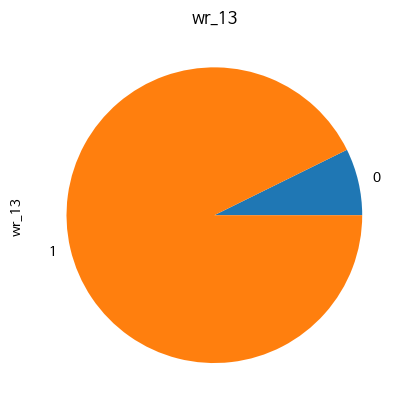

In [ ]:
for i in wf_r_columns:
    train_df[i].value_counts().sort_index().plot(kind='pie')
    plt.title(i)
    plt.show()

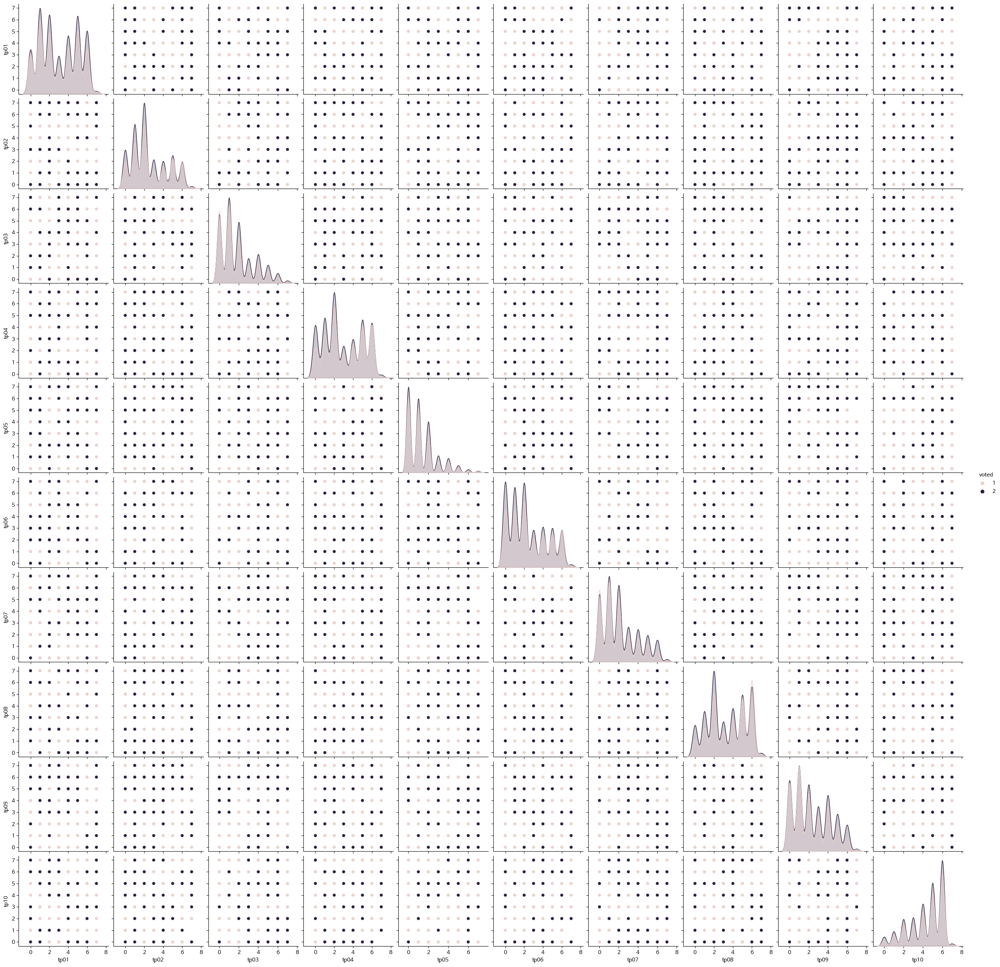

In [ ]:
ploting_col = tp_columns
sns.pairplot(train_df[ploting_col+['voted']], hue='voted', x_vars=ploting_col, y_vars=ploting_col)
plt.show()

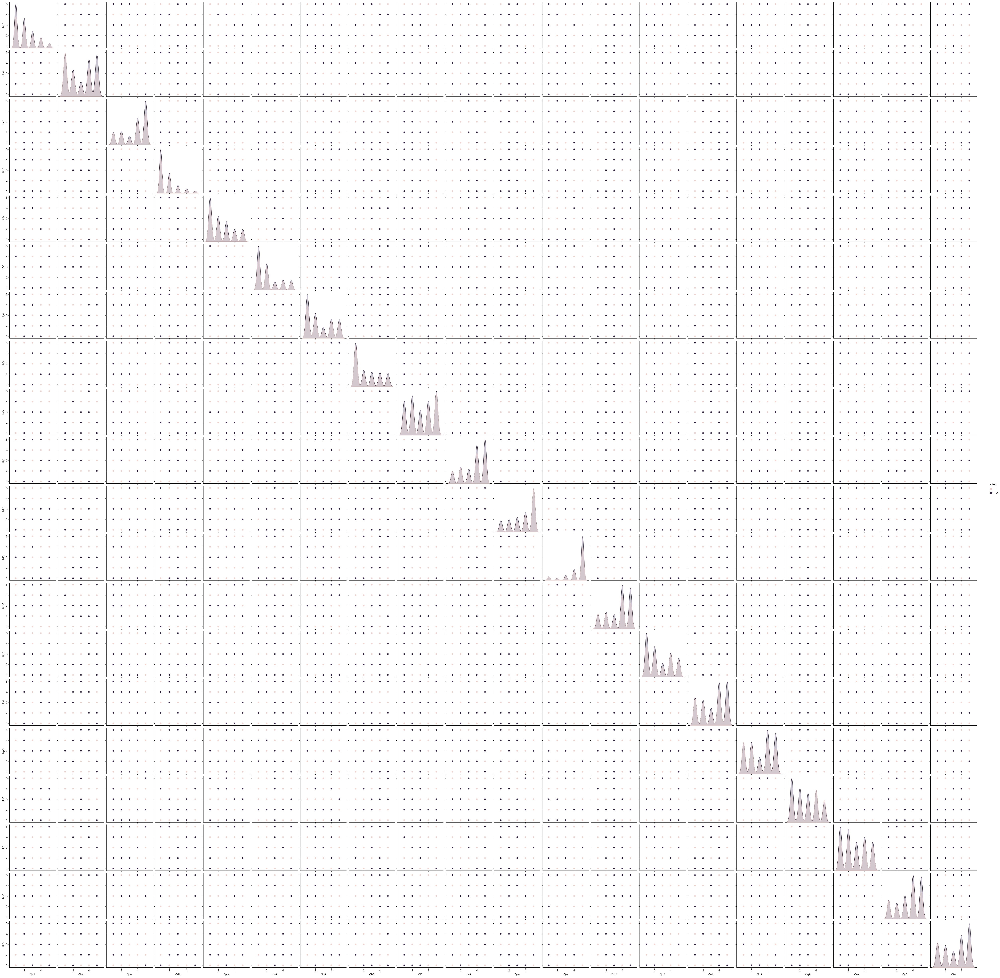

In [ ]:
ploting_col = QA_columns
sns.pairplot(train_df[ploting_col+['voted']], hue='voted', x_vars=ploting_col, y_vars=ploting_col)
plt.show()

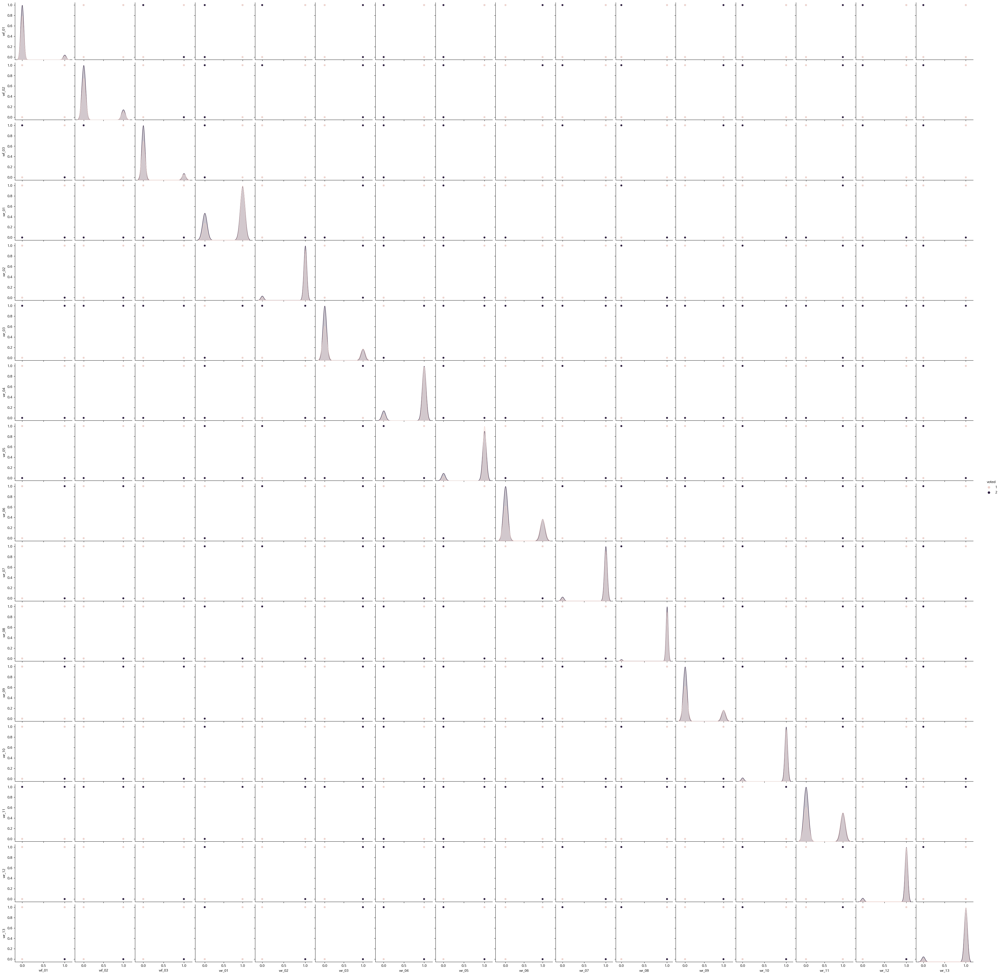

In [ ]:
ploting_col = wf_r_columns
sns.pairplot(train_df[ploting_col+['voted']], hue='voted', x_vars=ploting_col, y_vars=ploting_col)
plt.show()

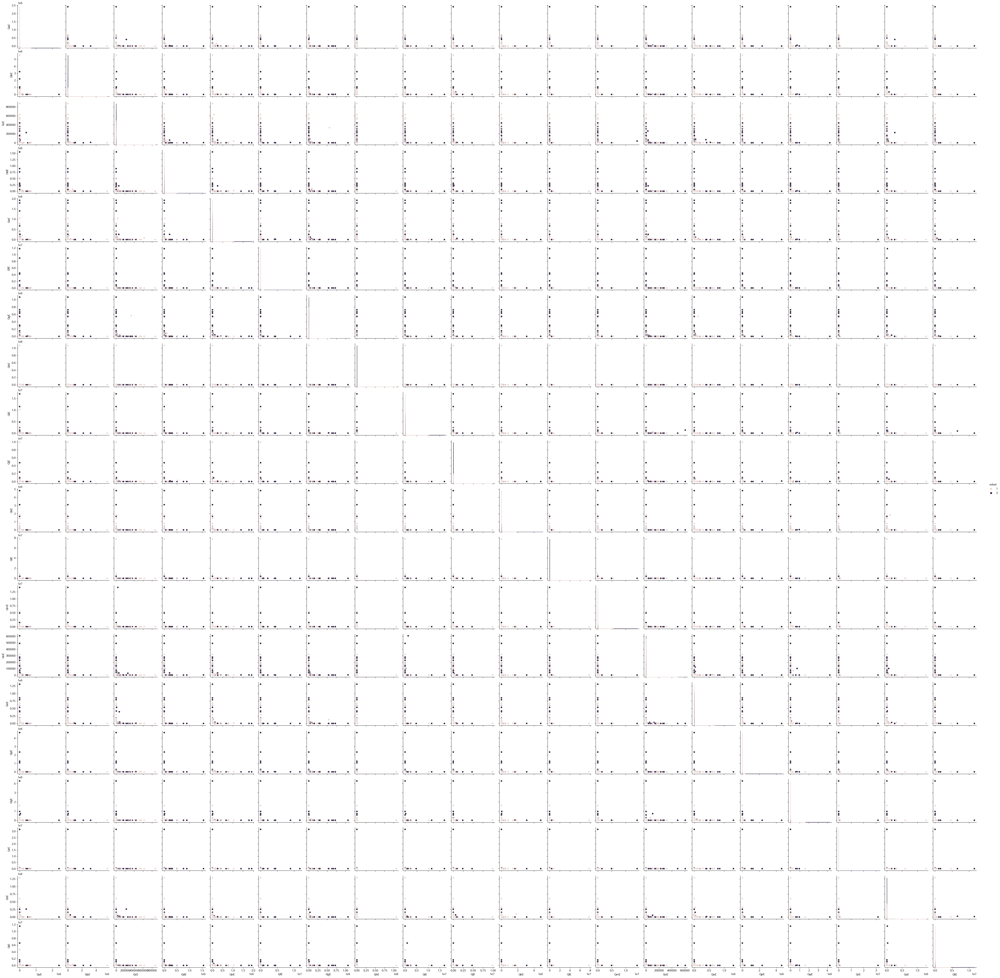

In [ ]:
ploting_col = QE_columns
sns.pairplot(train_df[ploting_col+['voted']], hue='voted', x_vars=ploting_col, y_vars=ploting_col)
plt.show()

In [ ]:
train_edit2 = pd.read_csv('train_edit2.csv')
train_edit2

,index,age_group,education,engnat,familysize,voted,gender_Female,gender_Male,married_Currently_married,married_Never_married,married_Other,married_Previously_married,race_Arab,race_Asian,race_Black,race_Indigenous Australian,race_Native American,race_Other,race_White,religion_Agnostic,religion_Atheist,religion_Buddhist,religion_Christian_Catholic,religion_Christian_Mormon,religion_Christian_Other,religion_Christian_Protestant,religion_Hindu,religion_Jewish,religion_Muslim,religion_Other,religion_Sikh,urban_Rural,urban_Suburban,urban_Urban,Extraversion,Agreeableness,Conscientiousness,EmotionalStability,OpennesstoExperiences,wr_mean,wf_mean
0,0,30,2,1,4,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,9,13,6,11,7,0.538462,0.000000
1,1,20,4,0,3,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,7,10,4,8,5,0.615385,0.000000
2,2,30,3,1,3,1,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,6,7,3,4,8,0.769231,0.333333
3,3,20,4,0,0,1,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,7,5,6,8,6,0.384615,0.000000
4,4,20,3,1,2,1,0,1,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,7,7,3,4,2,0.846154,0.333333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45527,45527,10,2,1,1,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,3,9,14,13,6,0.769231,0.333333
45528,45528,30,2,1,2,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,7,9,6,6,4,0.846154,0.333333
45529,45529,10,2,1,1,1,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,11,4,8,5,2,0.692308,0.000000
45530,45530,40,4,1,2,1,0,1,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,8,9,6,6,4,0.769231,0.000000
